<a href="https://colab.research.google.com/github/jiaminho/RPH-HAC-Prediction/blob/jiamin_branch/Copy_of_HAC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hospital Acquired Complications (HACs)

**GitHub Repository**: https://github.com/jiaminho/RPH-HAC-Prediction/tree/main

 **MIMIC-III**
- https://mimic.mit.edu/docs/iii/
- https://physionet.org/content/mimiciii/1.4/
- schema: https://mit-lcp.github.io/mimic-schema-spy/index.html

MIMIC-III is a relational database consisting of 26 tables. Tables are linked by identifiers which usually have the suffix ‘ID’. For example, SUBJECT_ID refers to a unique patient, HADM_ID refers to a unique admission to the hospital, and ICUSTAY_ID refers to a unique admission to an intensive care unit.

Five tables are used to define and track patient stays: ADMISSIONS; PATIENTS; ICUSTAYS; SERVICES; and TRANSFERS. Another five tables are dictionaries for cross-referencing codes against their respective definitions: D_CPT; D_ICD_DIAGNOSES; D_ICD_PROCEDURES; D_ITEMS; and D_LABITEMS. The remaining tables contain data associated with patient care, such as physiological measurements, caregiver observations, and billing information.

- mimic code repository: https://github.com/MIT-LCP/mimic-code
- mimic paper: https://www.nature.com/articles/sdata201635
- mimic website github: https://github.com/MIT-LCP/mimic-website
- mimic paper github: https://github.com/MIT-LCP/mimic-iii-paper/tree/master

HAC list: https://www.safetyandquality.gov.au/publications-and-resources/resource-library/hospital-acquired-complications-hacs-list-specifications-version-31-12th-edn

In [ ]:
# for google colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path_prefix = '/content/drive/My Drive/CITS5553 Capstone Project/Capstone Project - HAC/hacks_project/'

**Import necessary libraries**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import networkx as nx
import os
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import warnings
pd.set_option('display.max_columns', None)  # None ensures all columns are shown
warnings.simplefilter(action='ignore', category=FutureWarning)
# from tensorflow.keras.models import Model, Sequential
# from tensorflow.keras.layers import Input, Dense
# import umap

**Read files**

In [ ]:
# d_cpt = pd.read_csv(path_prefix + 'data/D_CPT.csv')               # 16K
d_labitems = pd.read_csv(path_prefix + 'data/D_LABITEMS.csv')       # 44K
# caregivers = pd.read_csv(path_prefix + 'data/CAREGIVERS.csv')     # 200K
d_icd_procedures = pd.read_csv(path_prefix + 'data/D_ICD_PROCEDURES.csv') #300K
d_items = pd.read_csv(path_prefix + 'data/D_ITEMS.csv')           # 936K
d_icd_diagnoses = pd.read_csv(path_prefix + 'data/D_ICD_DIAGNOSES.csv') # 1.4M
patients = pd.read_csv(path_prefix + 'data/PATIENTS.csv')         # 2.6M
# services = pd.read_csv(path_prefix + 'data/SERVICES.csv')         # 3.4M
# callout = pd.read_csv(path_prefix + 'data/CALLOUT.csv')           # 6.1M
# icustays = pd.read_csv(path_prefix + 'data/ICUSTAYS.csv')         # 6.1M
procedures_icd = pd.read_csv(path_prefix + 'data/PROCEDURES_ICD.csv')  # 6.5M
# drgcodes = pd.read_csv(path_prefix + 'data/DRGCODES.csv')         # 11M
admissions = pd.read_csv(path_prefix + 'data/ADMISSIONS.csv')      # 12M
diagnoses_icd = pd.read_csv(path_prefix + 'data/DIAGNOSES_ICD.csv')   # 19M
# transfers = pd.read_csv(path_prefix + 'data/TRANSFERS.csv')       # 24M
# procedureevents_mv = pd.read_csv(path_prefix + 'data/PROCEDUREEVENTS_MV.csv') # 47M
# cptevents = pd.read_csv(path_prefix + 'data/CPTEVENTS.csv') # 56M
microbiologyevents = pd.read_csv(path_prefix + 'data/MICROBIOLOGYEVENTS.csv')  # 70M
# outputevents = pd.read_csv(path_prefix + 'data/OUTPUTEVENTS.csv')  # 379M
# datetimeevents = pd.read_csv(path_prefix + 'data/DATETIMEEVENTS.csv') # 502M
# prescriptions = pd.read_csv(path_prefix + 'data/PRESCRIPTIONS.csv') # 735M
# inputevents_mv = pd.read_csv(path_prefix + 'data/INPUTEVENTS_MV.csv') # 931M
labevents = pd.read_csv(path_prefix + 'data/LABEVENTS.csv')       # 1.8G
# inputevents_cv = pd.read_csv(path_prefix + 'data/INPUTEVENTS_CV.csv') # 2.3G
# noteevents = pd.read_csv(path_prefix + 'data/NOTEEVENTS.csv')     # 3.5G

<div class="alert alert-block alert-info">
<h2>Exploratory Data Analysis and Data Cleaning</h2>
</div>


### 1. ADMISSIONS.csv

In [ ]:
admissions.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2196-04-09 10:06:00,2196-04-09 13:24:00,BENZODIAZEPINE OVERDOSE,0,1
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,BRAIN MASS,0,1
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,NaN,PROTESTANT QUAKER,SINGLE,WHITE,NaN,NaN,INTERIOR MYOCARDIAL INFARCTION,0,1
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2160-11-02 01:01:00,2160-11-02 04:27:00,ACUTE CORONARY SYNDROME,0,1


In [ ]:
admissions.shape

(58976, 19)

There are 58976 admissions with 19 variables

In [ ]:
missing_values = admissions.isnull().sum()
missing_values

ROW_ID                      0
SUBJECT_ID                  0
HADM_ID                     0
ADMITTIME                   0
DISCHTIME                   0
DEATHTIME               53122
ADMISSION_TYPE              0
ADMISSION_LOCATION          0
DISCHARGE_LOCATION          0
INSURANCE                   0
LANGUAGE                25332
RELIGION                  458
MARITAL_STATUS          10128
ETHNICITY                   0
EDREGTIME               28099
EDOUTTIME               28099
DIAGNOSIS                  25
HOSPITAL_EXPIRE_FLAG        0
HAS_CHARTEVENTS_DATA        0
dtype: int64

53 122 values (~ 90.1%) are missing for Deathtime. These missing values likely represent those that survived and hence did not have a time of death. EDREGTIME and EDOUTTIME are both missing 28 099 values (~ 47.6%). 25 332 values (~ 43.0%) are missing for Language. 10 128 values (17.2%) are missing from Marital Status. 458 values (~ 0.8%) are missing for religion. Diagnosis is missing 25 values (~ 0.04%).

Fill NA values with missing.

In [ ]:
print("Number of Unique Values for Each Column")
for i in admissions.columns.tolist():
    unique_values = len(admissions[i].unique())
    print(f"{i}: {unique_values}")

Number of Unique Values for Each Column
ROW_ID: 58976
SUBJECT_ID: 46520
HADM_ID: 58976
ADMITTIME: 58651
DISCHTIME: 58657
DEATHTIME: 5835
ADMISSION_TYPE: 4
ADMISSION_LOCATION: 9
DISCHARGE_LOCATION: 17
INSURANCE: 5
LANGUAGE: 76
RELIGION: 21
MARITAL_STATUS: 8
ETHNICITY: 41
EDREGTIME: 30875
EDOUTTIME: 30865
DIAGNOSIS: 15692
HOSPITAL_EXPIRE_FLAG: 2
HAS_CHARTEVENTS_DATA: 2


There are 15692 unique values in the 'DIAGNOSIS' column.

Top 20 Most Common Admission Diagnoses

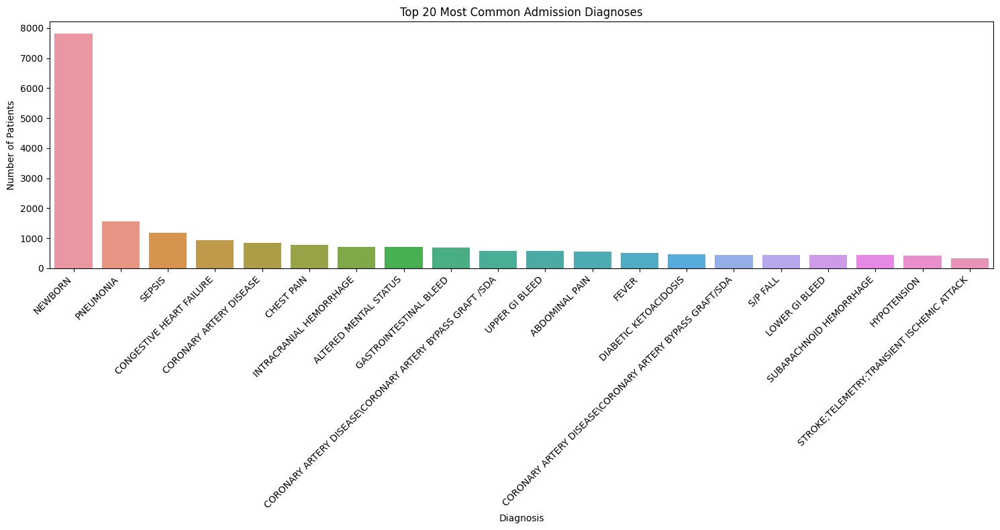

In [ ]:
# Count the occurrences of each diagnosis
diagnosis_counts = admissions['DIAGNOSIS'].value_counts()

# Take the top 20 most common diagnoses
top_diagnoses = diagnosis_counts.head(20)

# Plot
plt.figure(figsize=(15, 8))
sns.barplot(x=top_diagnoses.index, y=top_diagnoses.values)
plt.title('Top 20 Most Common Admission Diagnoses')
plt.xlabel('Diagnosis')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45, ha='right')  # Rotate the diagnosis names for better readability
plt.tight_layout()
plt.show()

Bar plot above shows the most common admission diagnoses.

In [ ]:
# function for plotting horizontal bar plots
def plot_categorical_data(column_name, df):
    plt.figure(figsize=(15, 8))
    sns.countplot(data=df, y=column_name, order = df[column_name].value_counts().index)
    plt.title(f'Distribution of {column_name}')
    plt.xlabel('Number of Admissions')
    plt.tight_layout()
    plt.show()

# function for plotting verical bar plots
def plot_vertical_categorical_data(column_name, df, top_n, fontsize=8):
    df_counts = df[column_name].value_counts()
    top_X = df_counts.head(top_n)

    plt.figure(figsize=(5, 4))
    sns.barplot(x=top_X.index, y=top_X.values)

    plt.title('Top '+str(top_n)+' Most Common ' + column_name, fontsize=fontsize+2)
    plt.xlabel(column_name, fontsize=fontsize)
    plt.ylabel('Number of Admissions', fontsize=fontsize)
    plt.xticks(rotation=45, ha='right', fontsize=fontsize)  # Rotate the diagnosis names for better readability
    plt.yticks(fontsize=fontsize)
    plt.tight_layout()
    plt.show()

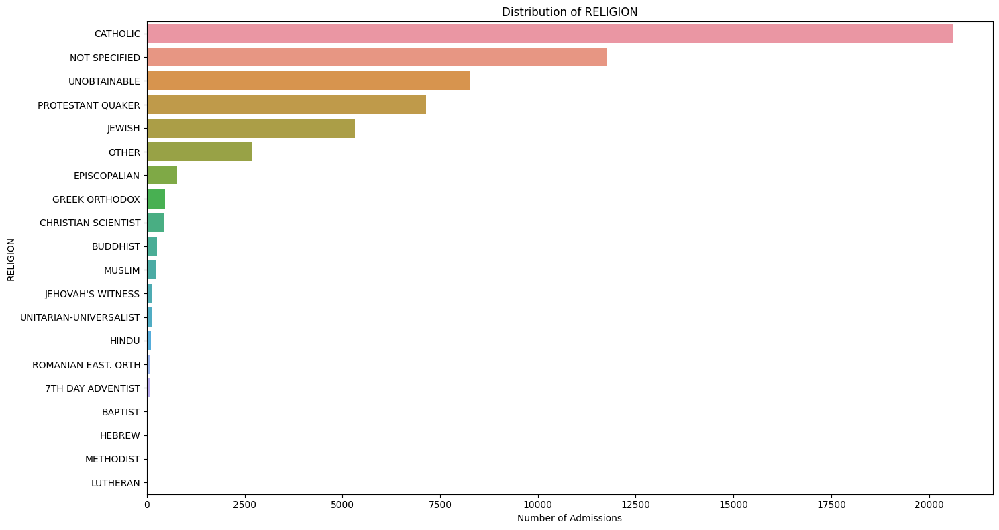

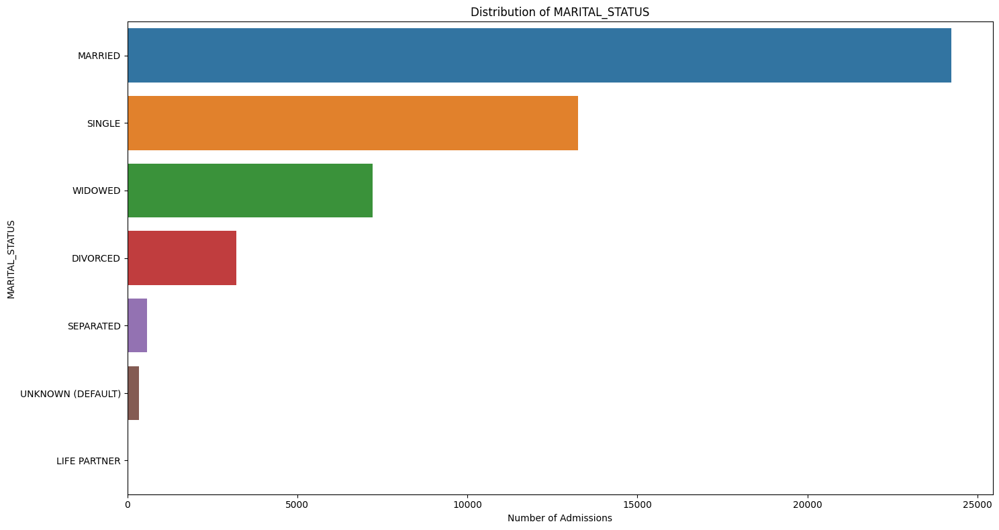

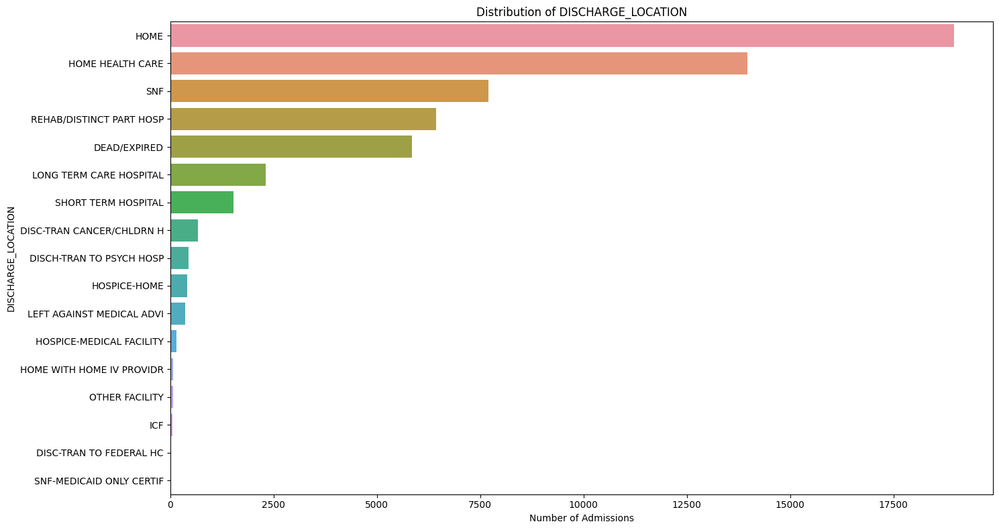

In [ ]:
# Visualizing each column
for column in ['RELIGION', 'MARITAL_STATUS', 'DISCHARGE_LOCATION',]:
    plot_categorical_data(column, admissions)

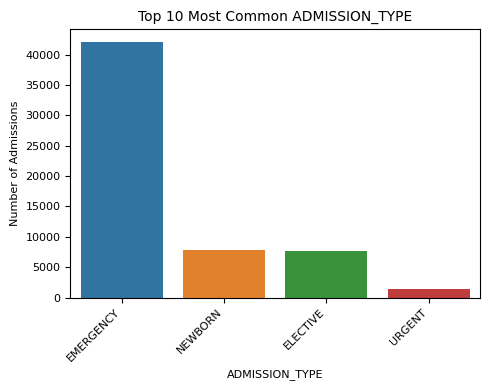

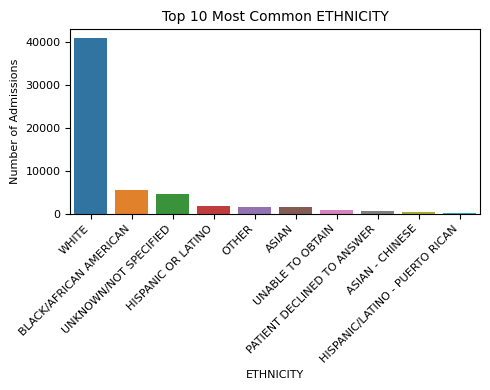

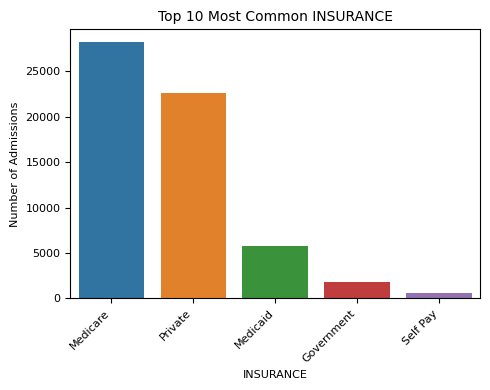

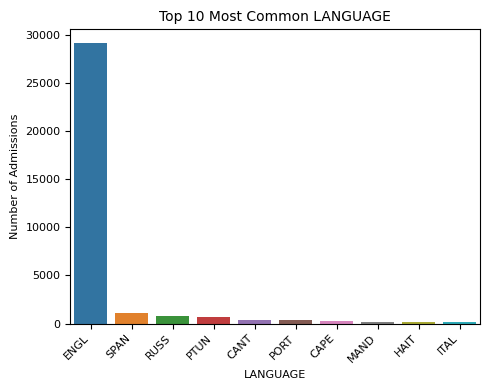

In [ ]:
for column in ['ADMISSION_TYPE', 'ETHNICITY', 'INSURANCE', 'LANGUAGE', ]:
    plot_vertical_categorical_data(column, df=admissions, top_n=10)

Visualize percentage of patients died

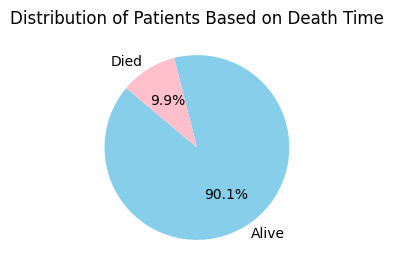

In [ ]:
# Create a new column 'DEATH_STATUS' to classify patients
admissions['DEATH_STATUS'] = admissions['DEATHTIME'].apply(lambda x: 'Died' if pd.notna(x) else 'Alive')

# Get the counts of each category
death_counts = admissions['DEATH_STATUS'].value_counts()

# Plot
plt.figure(figsize=(5,3))
plt.pie(death_counts, labels=death_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'pink'])
plt.title('Distribution of Patients Based on Death Time')
plt.show()

**Add admission_duration column**

In [ ]:
# calculate admission duration
admissions['ADMITTIME'] = pd.to_datetime(admissions['ADMITTIME'])
admissions['DISCHTIME'] = pd.to_datetime(admissions['DISCHTIME'])

admissions['admission_duration'] = admissions['DISCHTIME'] - admissions['ADMITTIME']

print(admissions['admission_duration'])

0        1 days 03:28:00
1        5 days 11:55:00
2        6 days 18:26:00
3        2 days 20:34:00
4        3 days 12:49:00
              ...       
58971    2 days 17:49:00
58972    0 days 13:10:00
58973    8 days 04:53:00
58974   41 days 10:42:00
58975    1 days 14:35:00
Name: admission_duration, Length: 58976, dtype: timedelta64[ns]


### 2. PATIENTS.csv

In [ ]:
patients

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG
0,234,249,F,2075-03-13 00:00:00,NaN,NaN,NaN,0
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1
2,236,251,M,2090-03-15 00:00:00,NaN,NaN,NaN,0
3,237,252,M,2078-03-06 00:00:00,NaN,NaN,NaN,0
4,238,253,F,2089-11-26 00:00:00,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...
46515,31840,44089,M,2026-05-25 00:00:00,NaN,NaN,NaN,0
46516,31841,44115,F,2124-07-27 00:00:00,NaN,NaN,NaN,0
46517,31842,44123,F,2049-11-26 00:00:00,2135-01-12 00:00:00,2135-01-12 00:00:00,NaN,1
46518,31843,44126,F,2076-07-25 00:00:00,NaN,NaN,NaN,0


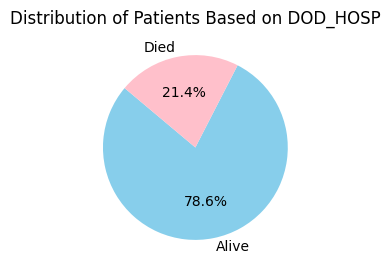

In [ ]:
# Create a new column 'DEATH_HOSP' to classify patients died in hospital
patients['DEATH_HOSP'] = patients['DOD_HOSP'].apply(lambda x: 'Died' if pd.notna(x) else 'Alive')

# Get the counts of each category
death_counts = patients['DEATH_HOSP'].value_counts()

# Plot
plt.figure(figsize=(5,3))
plt.pie(death_counts, labels=death_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'pink'])
plt.title('Distribution of Patients Based on DOD_HOSP')
plt.show()

show distribution of gender

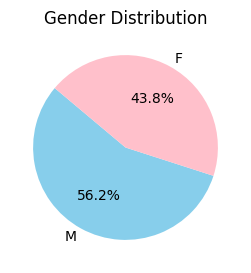

In [ ]:
# Count occurrences of each gender
gender_counts = patients['GENDER'].value_counts()

# Plot pie chart
plt.figure(figsize=(5, 3))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'pink'])
plt.title('Gender Distribution')
plt.show()

### admission_merged

Merge patient data with admission data

In [ ]:
# Merge patients with admission using a left merge
admission_merged = pd.merge(admissions, patients, on='SUBJECT_ID', how='left')
admission_merged

,ROW_ID_x,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA,DEATH_STATUS,admission_duration,ROW_ID_y,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,DEATH_HOSP
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2196-04-09 10:06:00,2196-04-09 13:24:00,BENZODIAZEPINE OVERDOSE,0,1,Alive,1 days 03:28:00,19,F,2131-05-07 00:00:00,NaN,NaN,NaN,0,Alive
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1,Alive,5 days 11:55:00,20,M,2082-07-17 00:00:00,NaN,NaN,NaN,0,Alive
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,BRAIN MASS,0,1,Alive,6 days 18:26:00,20,M,2082-07-17 00:00:00,NaN,NaN,NaN,0,Alive
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,NaN,PROTESTANT QUAKER,SINGLE,WHITE,NaN,NaN,INTERIOR MYOCARDIAL INFARCTION,0,1,Alive,2 days 20:34:00,21,M,2100-05-31 00:00:00,NaN,NaN,NaN,0,Alive
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2160-11-02 01:01:00,2160-11-02 04:27:00,ACUTE CORONARY SYNDROME,0,1,Alive,3 days 12:49:00,22,M,2101-11-21 00:00:00,NaN,NaN,NaN,0,Alive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58971,58594,98800,191113,2131-03-30 21:13:00,2131-04-02 15:02:00,NaN,EMERGENCY,CLINIC REFERRAL/PREMATURE,HOME,Private,ENGL,NOT SPECIFIED,SINGLE,WHITE,2131-03-30 19:44:00,2131-03-30 22:41:00,TRAUMA,0,1,Alive,2 days 17:49:00,46213,F,2111-11-05 00:00:00,NaN,NaN,NaN,0,Alive
58972,58595,98802,101071,2151-03-05 20:00:00,2151-03-06 09:10:00,2151-03-06 09:10:00,EMERGENCY,CLINIC REFERRAL/PREMATURE,DEAD/EXPIRED,Medicare,ENGL,CATHOLIC,WIDOWED,WHITE,2151-03-05 17:23:00,2151-03-05 21:06:00,SAH,1,1,Died,0 days 13:10:00,46214,F,2067-09-21 00:00:00,2151-03-06 00:00:00,2151-03-06 00:00:00,NaN,1,Died
58973,58596,98805,122631,2200-09-12 07:15:00,2200-09-20 12:08:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Private,ENGL,NOT SPECIFIED,MARRIED,WHITE,NaN,NaN,RENAL CANCER/SDA,0,1,Alive,8 days 04:53:00,46215,M,2158-03-02 00:00:00,NaN,NaN,NaN,0,Alive
58974,58597,98813,170407,2128-11-11 02:29:00,2128-12-22 13:11:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,SNF,Private,ENGL,CATHOLIC,MARRIED,WHITE,2128-11-10 23:48:00,2128-11-11 03:16:00,S/P FALL,0,0,Alive,41 days 10:42:00,46216,F,2068-02-04 00:00:00,NaN,NaN,NaN,0,Alive


In [ ]:
duplicated_count = admission_merged.duplicated().sum()
print(f"Number of duplicated rows: {duplicated_count}")

Number of duplicated rows: 0


**Calculate the age** of each patient using the 'DOB' column. However, it's essential to be aware that dates in MIMIC-III have been shifted to protect patient privacy. Therefore, we're calculating a pseudonymized age rather than the actual age.

In [ ]:
# Convert ADMITTIME and DOB to datetime format
admission_merged['ADMITTIME'] = pd.to_datetime(admission_merged['ADMITTIME'])
admission_merged['DOB'] = pd.to_datetime(admission_merged['DOB'])


def calculate_age(admit_time, dob):
    try:
        # Convert pandas timestamps to Python datetime objects
        admit_datetime = admit_time.to_pydatetime()
        dob_datetime = dob.to_pydatetime()

        # Calculate age
        age = int((admit_datetime - dob_datetime).days // 365.25)
        return age if age > 0 else np.nan  # Assign NaN for negative ages
    except OverflowError:
        return np.nan

# Use the 'apply' method with the function
admission_merged['AGE_AT_ADMISSION'] = admission_merged.apply(lambda row: calculate_age(row['ADMITTIME'], row['DOB']), axis=1)
admission_merged.head()

,ROW_ID_x,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA,DEATH_STATUS,admission_duration,ROW_ID_y,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,DEATH_HOSP,AGE_AT_ADMISSION
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2196-04-09 10:06:00,2196-04-09 13:24:00,BENZODIAZEPINE OVERDOSE,0,1,Alive,1 days 03:28:00,19,F,2131-05-07,NaN,NaN,NaN,0,Alive,64.0
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1,Alive,5 days 11:55:00,20,M,2082-07-17,NaN,NaN,NaN,0,Alive,71.0
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,BRAIN MASS,0,1,Alive,6 days 18:26:00,20,M,2082-07-17,NaN,NaN,NaN,0,Alive,75.0
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,NaN,PROTESTANT QUAKER,SINGLE,WHITE,NaN,NaN,INTERIOR MYOCARDIAL INFARCTION,0,1,Alive,2 days 20:34:00,21,M,2100-05-31,NaN,NaN,NaN,0,Alive,39.0
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2160-11-02 01:01:00,2160-11-02 04:27:00,ACUTE CORONARY SYNDROME,0,1,Alive,3 days 12:49:00,22,M,2101-11-21,NaN,NaN,NaN,0,Alive,58.0


In [ ]:
nan_count = admission_merged['DOB'].isna().sum()
print(f"The number of NaN values in the 'DOB' column is: {nan_count}")

The number of NaN values in the 'DOB' column is: 0


In [ ]:
nan_count = admission_merged['ADMITTIME'].isna().sum()
print(f"The number of NaN values in the 'ADMITTIME' column is: {nan_count}")

The number of NaN values in the 'ADMITTIME' column is: 0


In [ ]:
nan_count = admission_merged['AGE_AT_ADMISSION'].isna().sum()
print(f"The number of NaN values in the 'AGE_AT_ADMISSION' column is: {nan_count}")

The number of NaN values in the 'AGE_AT_ADMISSION' column is: 8110


In [ ]:
print(round(nan_count/58976*100), '% admissions have negative ages or encountered OverflowError when calculating age')

14 % admissions have negative ages or encountered OverflowError when calculating age


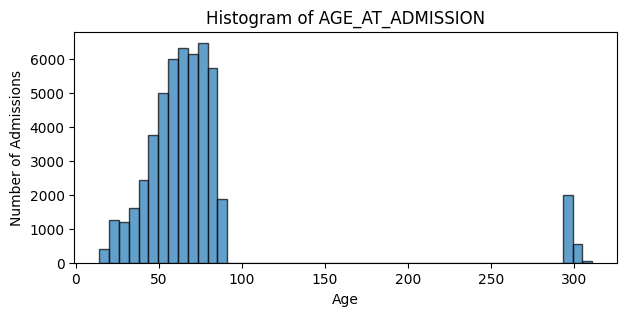

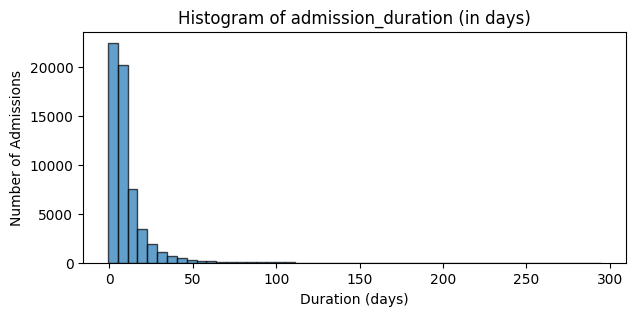

In [ ]:
# Plotting histogram for 'AGE_AT_ADMISSION'
plt.figure(figsize=(7, 3))
plt.hist(admission_merged['AGE_AT_ADMISSION'], bins=50, edgecolor='black', alpha=0.7)
plt.title('Histogram of AGE_AT_ADMISSION')
plt.xlabel('Age')
plt.ylabel('Number of Admissions')
plt.show()

# Plotting histogram for 'admission_duration'
# Convert the 'admission_duration' column to days
admission_duration_days = admission_merged['admission_duration'].dt.total_seconds() / (24 * 3600)

plt.figure(figsize=(7, 3))
plt.hist(admission_duration_days, bins=50, edgecolor='black', alpha=0.7)
plt.title('Histogram of admission_duration (in days)')
plt.xlabel('Duration (days)')
plt.ylabel('Number of Admissions')
plt.show()


There are some outliers in 'AGE_AT_ADMISSION', with some patients being ~300 years old.

In [ ]:
age_stats = admission_merged['AGE_AT_ADMISSION'].describe()
print("Statistics for AGE_AT_ADMISSION:")
print(age_stats)

Statistics for AGE_AT_ADMISSION:
count    50866.000000
mean        74.182008
std         54.934994
min         14.000000
25%         52.000000
50%         65.000000
75%         77.000000
max        311.000000
Name: AGE_AT_ADMISSION, dtype: float64


median age = 65

max age = 311?

In [ ]:
implausible_ages = admission_merged[admission_merged['AGE_AT_ADMISSION'] > 130]
implausible_ages

,ROW_ID_x,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA,DEATH_STATUS,admission_duration,ROW_ID_y,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,DEATH_HOSP,AGE_AT_ADMISSION
8,29,30,104557,2172-10-14 14:17:00,2172-10-19 14:37:00,NaN,URGENT,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,NaN,CATHOLIC,MARRIED,UNKNOWN/NOT SPECIFIED,NaN,NaN,UNSTABLE ANGINA\CATH,0,1,Alive,5 days 00:20:00,26,M,1872-10-14,NaN,NaN,NaN,0,Alive,299.0
12,33,34,115799,2186-07-18 16:46:00,2186-07-20 16:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,CHEST PAIN\CATH,0,1,Alive,1 days 23:14:00,30,M,1886-07-18,2192-01-30 00:00:00,NaN,2192-01-30 00:00:00,1,Alive,299.0
13,34,34,144319,2191-02-23 05:23:00,2191-02-25 20:20:00,NaN,EMERGENCY,CLINIC REFERRAL/PREMATURE,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,2191-02-23 04:23:00,2191-02-23 07:25:00,BRADYCARDIA,0,1,Alive,2 days 14:57:00,30,M,1886-07-18,2192-01-30 00:00:00,NaN,2192-01-30 00:00:00,1,Alive,304.0
39,473,368,105889,2137-07-11 17:56:00,2137-07-16 16:00:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,SNF,Medicare,NaN,NOT SPECIFIED,WIDOWED,WHITE,2137-07-11 15:00:00,2137-07-11 19:50:00,PNEUMONIA,0,1,Alive,4 days 22:04:00,347,M,1837-07-11,2141-01-28 00:00:00,NaN,2141-01-28 00:00:00,1,Alive,299.0
40,474,368,138061,2139-12-16 19:48:00,2139-12-22 16:15:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,SNF,Medicare,NaN,NOT SPECIFIED,WIDOWED,WHITE,2139-12-15 21:10:00,2139-12-16 22:05:00,PNEUMONIA,0,1,Alive,5 days 20:27:00,347,M,1837-07-11,2141-01-28 00:00:00,NaN,2141-01-28 00:00:00,1,Alive,302.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58911,57504,95420,137041,2141-07-27 09:30:00,2141-08-02 17:53:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,REHAB/DISTINCT PART HOSP,Medicare,ENGL,CATHOLIC,WIDOWED,WHITE,NaN,NaN,"AORTIC STENOSIS\RE-DO STERNOTOMY, AORTIC VALVE...",0,1,Alive,6 days 08:23:00,45320,M,1841-07-27,NaN,NaN,NaN,0,Alive,299.0
58920,58543,98647,167391,2156-02-28 17:21:00,2156-03-09 14:49:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,REHAB/DISTINCT PART HOSP,Medicare,RUSS,JEWISH,SINGLE,WHITE,2156-02-28 11:28:00,2156-02-28 20:33:00,LEFT FEMUR FRACTURE,0,1,Alive,9 days 21:28:00,46172,M,1856-02-28,2156-04-12 00:00:00,NaN,2156-04-12 00:00:00,1,Alive,299.0
58939,58562,98713,105148,2140-04-04 13:11:00,2140-04-07 17:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Medicare,ENGL,CATHOLIC,WIDOWED,WHITE,NaN,NaN,ST-SEGMENT ELEVATION MYOCARDIAL INFARCTION\CAR...,0,1,Alive,3 days 03:49:00,46190,F,1840-04-04,NaN,NaN,NaN,0,Alive,299.0
58940,58563,98714,171885,2104-11-12 12:31:00,2104-11-15 14:40:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,JEWISH,UNKNOWN (DEFAULT),WHITE,NaN,NaN,CORONARY ARTERY DISEASE\RIGHT CORONARY ARTERY ...,0,1,Alive,3 days 02:09:00,46191,M,1804-11-12,2105-01-23 00:00:00,2105-01-23 00:00:00,2105-01-23 00:00:00,1,Died,299.0


There are 2616 admissions with implausible ages of > 130.

In [ ]:
print('percentage of implausible ages:', round(2616/58976*100), '%')

percentage of implausible ages: 4 %


Replace implausible age values (>130) with the median age

In [ ]:
# Compute the median age
median_age = admission_merged['AGE_AT_ADMISSION'].median()

# Replace values greater than 100 with the median age
admission_merged.loc[admission_merged['AGE_AT_ADMISSION'] > 130, 'AGE_AT_ADMISSION'] = median_age

In [ ]:
updated_age_stats = admission_merged['AGE_AT_ADMISSION'].describe()
print("Updated Statistics for AGE_AT_ADMISSION:")
print(updated_age_stats)

Updated Statistics for AGE_AT_ADMISSION:
count    50866.000000
mean        62.113278
std         16.171175
min         14.000000
25%         52.000000
50%         65.000000
75%         75.000000
max         88.000000
Name: AGE_AT_ADMISSION, dtype: float64


In [ ]:
duration_stats = admission_duration_days.describe()
print("Statistics for admission_duration:")
print(duration_stats)

Statistics for admission_duration:
count    58976.000000
mean        10.133916
std         12.456682
min         -0.945139
25%          3.743750
50%          6.467014
75%         11.795139
max        294.660417
Name: admission_duration, dtype: float64


- The minimum value being negative doesn't make sense for a duration.
- The large standard deviation relative to the mean suggests a wide spread in the data.
- The max value seems very high, although it might be plausible depending on the context.

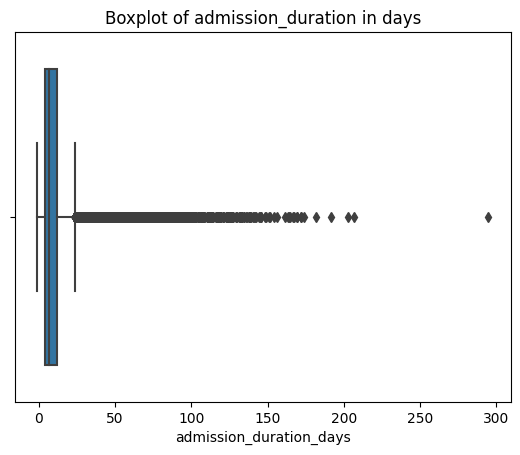

In [ ]:
# Convert timedelta to days
admission_merged['admission_duration_days'] = admission_merged['admission_duration'].dt.total_seconds() / (24 * 3600)

# Plot the boxplot
sns.boxplot(x=admission_merged['admission_duration_days'])
plt.title('Boxplot of admission_duration in days')
plt.show()

In [ ]:
count_over_200_days = (admission_merged['admission_duration_days'] > 200).sum()
print(count_over_200_days)

3


In [ ]:
count_negative_days = (admission_merged['admission_duration_days'] < 0).sum()
print(count_negative_days)

98


### 3. DIAGNOSES_ICD.csv

DIAGNOSES_ICD: recorded 6 weeks after patient discharged.

In [ ]:
diagnoses_icd

,ROW_ID,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE
0,1297,109,172335,1.0,40301
1,1298,109,172335,2.0,486
2,1299,109,172335,3.0,58281
3,1300,109,172335,4.0,5855
4,1301,109,172335,5.0,4254
...,...,...,...,...,...
651042,639798,97503,188195,2.0,20280
651043,639799,97503,188195,3.0,V5869
651044,639800,97503,188195,4.0,V1279
651045,639801,97503,188195,5.0,5275


In [ ]:
diagnoses_icd['ICD9_CODE'].isnull().sum()

47

47 admitted patients do not have ICD9_CODE

### 4. D_ICD_DIAGNOSES.csv

In [ ]:
d_icd_diagnoses

,ROW_ID,ICD9_CODE,SHORT_TITLE,LONG_TITLE
0,174,01166,TB pneumonia-oth test,"Tuberculous pneumonia [any form], tubercle bac..."
1,175,01170,TB pneumothorax-unspec,"Tuberculous pneumothorax, unspecified"
2,176,01171,TB pneumothorax-no exam,"Tuberculous pneumothorax, bacteriological or h..."
3,177,01172,TB pneumothorx-exam unkn,"Tuberculous pneumothorax, bacteriological or h..."
4,178,01173,TB pneumothorax-micro dx,"Tuberculous pneumothorax, tubercle bacilli fou..."
...,...,...,...,...
14562,14432,V7399,Scrn unspcf viral dis,Special screening examination for unspecified ...
14563,14433,V740,Screening for cholera,Screening examination for cholera
14564,14434,V741,Screening-pulmonary TB,Screening examination for pulmonary tuberculosis
14565,14435,V742,Screening for leprosy,Screening examination for leprosy (Hansen's di...


### diagnosis_merged
Merge diagnosis ICD9_CODE to their respective names

In [ ]:
# Convert the ICD9_CODE columns in all DataFrames to string data type
d_icd_diagnoses['ICD9_CODE'] = d_icd_diagnoses['ICD9_CODE'].astype(str)
diagnoses_icd['ICD9_CODE'] = diagnoses_icd['ICD9_CODE'].astype(str)

# Merge diagnosis with diagnosis_icd using a left merge
diagnosis_merged = pd.merge(diagnoses_icd, d_icd_diagnoses, on='ICD9_CODE', how='left')
diagnosis_merged

,ROW_ID_x,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE,ROW_ID_y,SHORT_TITLE,LONG_TITLE
0,1297,109,172335,1.0,40301,4312.0,Mal hyp kid w cr kid V,"Hypertensive chronic kidney disease, malignant..."
1,1298,109,172335,2.0,486,5528.0,"Pneumonia, organism NOS","Pneumonia, organism unspecified"
2,1299,109,172335,3.0,58281,5892.0,Chr nephritis in oth dis,Chronic glomerulonephritis in diseases classif...
3,1300,109,172335,4.0,5855,5913.0,Chron kidney dis stage V,"Chronic kidney disease, Stage V"
4,1301,109,172335,5.0,4254,4435.0,Prim cardiomyopathy NEC,Other primary cardiomyopathies
...,...,...,...,...,...,...,...,...
651042,639798,97503,188195,2.0,20280,1859.0,Oth lymp unsp xtrndl org,"Other malignant lymphomas, unspecified site, e..."
651043,639799,97503,188195,3.0,V5869,12800.0,Long-term use meds NEC,Long-term (current) use of other medications
651044,639800,97503,188195,4.0,V1279,13957.0,Prsnl hst ot spf dgst ds,Personal history of other diseases of digestiv...
651045,639801,97503,188195,5.0,5275,5971.0,Sialolithiasis,Sialolithiasis


Since a patient can have multiple ICD-9 codes during a single admission (i.e., they can have multiple diagnoses), the SEQ_NUM helps in denoting the order or priority of those diagnoses. A SEQ_NUM of 1 denotes the primary diagnosis, which is often the main reason for the hospital admission.

In [ ]:
duplicated_count = diagnosis_merged.duplicated().sum()
print(f"Number of duplicated rows: {duplicated_count}")

Number of duplicated rows: 0


**Most Common ICD-9 Codes**

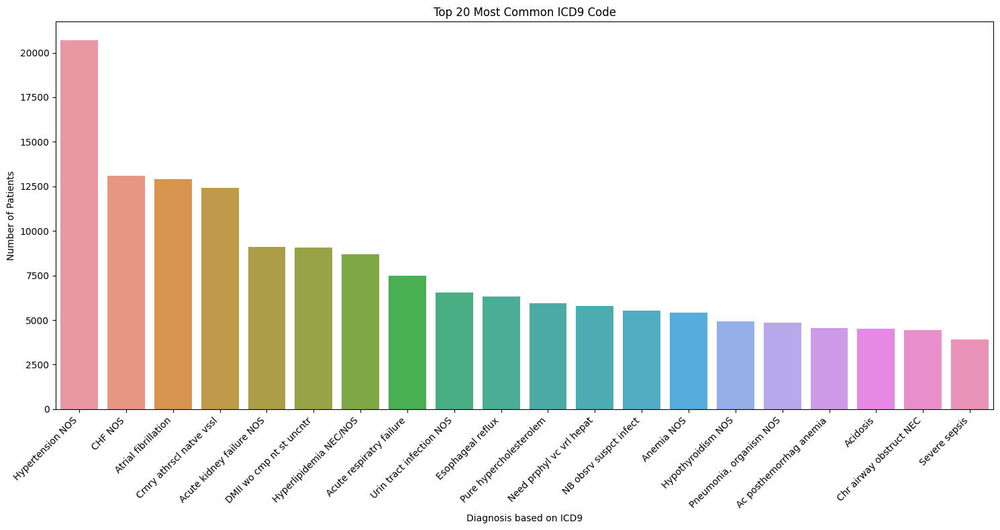

In [ ]:
# Count the occurrences of each icd
icd_counts = diagnosis_merged['SHORT_TITLE'].value_counts()

# Take the top 20 most common icd
top_icd = icd_counts.head(20)

# Plot
plt.figure(figsize=(15, 8))
sns.barplot(x=top_icd.index, y=top_icd.values)
plt.title('Top 20 Most Common ICD9 Code')
plt.xlabel('Diagnosis based on ICD9')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45, ha='right')  # Rotate the diagnosis names for better readability
plt.tight_layout()
plt.show()

The bar chart above shows the top 20 most common ICD9 code.

Filter the diagnosis_merged table for the specific HADM_ID of 188195 and then retrieve the ICD9_CODE and SHORT_TITLE values associated with it

In [ ]:
# Filter for HADM_ID 188195
diagnosis188195 = diagnosis_merged[diagnosis_merged['HADM_ID'] == 188195][['ICD9_CODE', 'SHORT_TITLE']]

# Display the filtered data
print(diagnosis188195)


       ICD9_CODE               SHORT_TITLE
646694     28529  Anemia-other chronic dis
646695     07032  Hpt B chrn wo cm wo dlta
651041      7842   Swelling in head & neck
651042     20280  Oth lymp unsp xtrndl org
651043     V5869    Long-term use meds NEC
651044     V1279  Prsnl hst ot spf dgst ds
651045      5275            Sialolithiasis
651046      5569  Ulceratve colitis unspcf


This shows that one patient can have multiple diagnosis.

### 5. PROCEDURES_ICD.csv

In [ ]:
#procedures_icd

### 6. D_ICD_PROCEDURES.csv

In [ ]:
#d_icd_procedures

Check for duplicates in the procedure_icd table.

In [ ]:
# Count occurrences of each ICD9_CODE in procedure_icd
icd_counts = d_icd_procedures['ICD9_CODE'].value_counts()

# Filter out ICD9_CODE values that occur only once (i.e., retain only duplicates)
duplicates = icd_counts[icd_counts > 1]

print(duplicates)

101    2
613    2
714    2
713    2
700    2
      ..
111    2
863    2
110    2
96     2
412    2
Name: ICD9_CODE, Length: 73, dtype: int64


In [ ]:
# Find duplicated ICD9_CODE values in procedure_icd
duplicated_icd_codes = d_icd_procedures[d_icd_procedures['ICD9_CODE'].duplicated(keep=False)]

# Sort them by ICD9_CODE for easier inspection
duplicated_icd_codes_sorted = duplicated_icd_codes.sort_values(by='ICD9_CODE')

# Display the sorted duplicated rows
print(duplicated_icd_codes_sorted)


      ROW_ID  ICD9_CODE               SHORT_TITLE  \
449      261         16       Excise skull lesion   
335      147         16   Pressurized treat graft   
437      249         31  Intraspin nerve root div   
346      158         31              CAS w CT/CTA   
378      190         34  Excis spinal cord lesion   
...      ...        ...                       ...   
2063    2063        843    Amputation stump revis   
5        269        863  Lid reconst w hair graft   
3399    3479        863  Other local destruc skin   
6        270        864  Lid recon-tarsoconj flap   
3400    3480        864    Radical excis skin les   

                                             LONG_TITLE  
449                         Excision of lesion of skull  
335   Pressurized treatment of venous bypass graft [...  
437                  Division of intraspinal nerve root  
346               Computer assisted surgery with CT/CTA  
378   Excision or destruction of lesion of spinal co...  
...            

Combine data from duplicated rows. Concatenate the descriptions for the same ICD code


In [ ]:
# combine the descriptions for the same ICD code
d_icd_procedures['SHORT_TITLE'] = d_icd_procedures.groupby('ICD9_CODE')['SHORT_TITLE'].transform(lambda x: ' | '.join(x))
d_icd_procedures['LONG_TITLE'] = d_icd_procedures.groupby('ICD9_CODE')['LONG_TITLE'].transform(lambda x: ' | '.join(x))

procedure_icd_cleaned = d_icd_procedures.drop_duplicates(subset='ICD9_CODE', keep='first')
procedure_icd_cleaned

,ROW_ID,ICD9_CODE,SHORT_TITLE,LONG_TITLE
0,264,851,Canthotomy,Canthotomy
1,265,852,Blepharorrhaphy,Blepharorrhaphy
2,266,859,Adjust lid position NEC,Other adjustment of lid position
3,267,861,Lid reconst w skin graft,Reconstruction of eyelid with skin flap or graft
4,268,862,Lid reconst w muc graft,Reconstruction of eyelid with mucous membrane ...
...,...,...,...,...
3877,3344,9959,Vaccination/innocula NEC,Other vaccination and inoculation
3878,3345,9960,Cardiopulm resuscita NOS,"Cardiopulmonary resuscitation, not otherwise s..."
3879,3346,9961,Atrial cardioversion,Atrial cardioversion
3880,3347,9962,Heart countershock NEC,Other electric countershock of heart


### procedure_merged
Merge patient's (HADM_ID) procedure ICD9_CODE to their respective names

In [ ]:
# Convert the ICD9_CODE columns in all DataFrames to string data type
procedure_icd_cleaned = procedure_icd_cleaned.copy()
procedure_icd_cleaned['ICD9_CODE'] = procedure_icd_cleaned['ICD9_CODE'].astype(str)
procedures_icd['ICD9_CODE'] = procedures_icd['ICD9_CODE'].astype(str)

# Merge procedure with procedure_icd using a left merge
procedure_merged = pd.merge(procedures_icd, procedure_icd_cleaned, on='ICD9_CODE', how='left')
procedure_merged

,ROW_ID_x,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE,ROW_ID_y,SHORT_TITLE,LONG_TITLE
0,944,62641,154460,3,3404,496.0,Insert intercostal cath,Insertion of intercostal catheter for drainage
1,945,2592,130856,1,9671,3678.0,Cont inv mec ven <96 hrs,Continuous invasive mechanical ventilation for...
2,946,2592,130856,2,3893,801.0,Venous cath NEC,"Venous catheterization, not elsewhere classified"
3,947,55357,119355,1,9672,3679.0,Cont inv mec ven 96+ hrs,Continuous invasive mechanical ventilation for...
4,948,55357,119355,2,331,187.0,Spinal tap | Incision of lung,Spinal tap | Incision of lung
...,...,...,...,...,...,...,...,...
240090,228330,67415,150871,5,3736,1300.0,"Exc,destrct,exclus LAA","Excision, destruction, or exclusion of left at..."
240091,228331,67415,150871,6,3893,801.0,Venous cath NEC,"Venous catheterization, not elsewhere classified"
240092,228332,67415,150871,7,8872,3233.0,Dx ultrasound-heart,Diagnostic ultrasound of heart
240093,228333,67415,150871,8,3893,801.0,Venous cath NEC,"Venous catheterization, not elsewhere classified"


In [ ]:
duplicated_count = procedure_merged.duplicated().sum()
print(f"Number of duplicated rows: {duplicated_count}")

Number of duplicated rows: 0


Show top 20 procedures being performed in the hospital

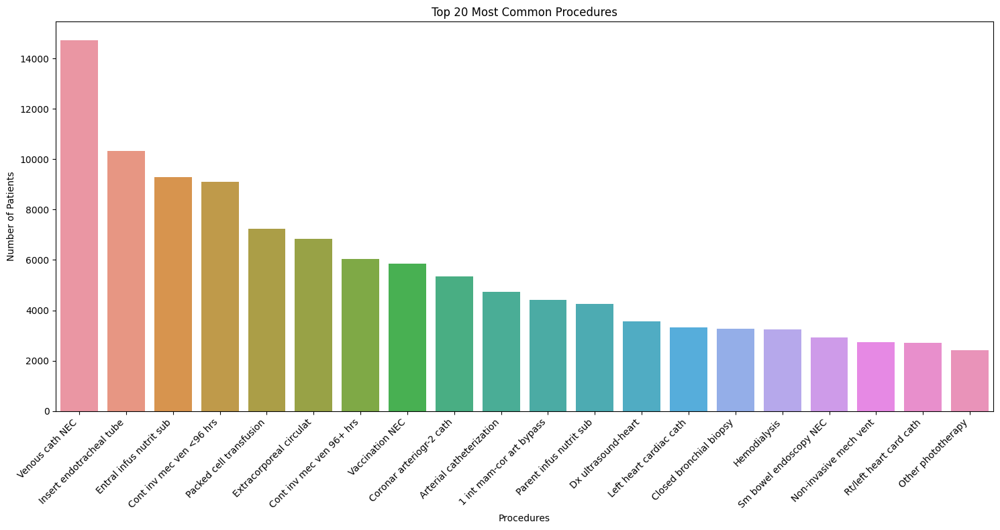

In [ ]:
# Count the occurrences of each icd
procedure_counts = procedure_merged['SHORT_TITLE'].value_counts()

# Take the top 20 most common icd
top_precedure = procedure_counts.head(20)

# Plot
plt.figure(figsize=(15, 8))
sns.barplot(x=top_precedure.index, y=top_precedure.values)
plt.title('Top 20 Most Common Procedures')
plt.xlabel('Procedures')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45, ha='right')  # Rotate the procedures names for better readability
plt.tight_layout()
plt.show()

In [ ]:
# Filter for HADM_ID 150871
procedures150871 = procedure_merged[procedure_merged['HADM_ID'] == 150871][['ICD9_CODE', 'SHORT_TITLE']]

# Display the filtered data
print(procedures150871)

       ICD9_CODE               SHORT_TITLE
232505      8856  Coronar arteriogr-2 cath
240086      3523  Opn/oth rep mtrl vlv-tis
240087      3733  Exc/dest hrt lesion open
240088      3961   Extracorporeal circulat
240089      3727           Cardiac mapping
240090      3736    Exc,destrct,exclus LAA
240091      3893           Venous cath NEC
240092      8872       Dx ultrasound-heart
240093      3893           Venous cath NEC
240094      3722   Left heart cardiac cath


This shows one admission can also have multiple procedures

### 7. PROCEDUREEVENTS_MV.csv

In [ ]:
#procedureevents_mv

### 8. D_LABITEMS.csv

In [ ]:
#d_labitems

### 9. LABEVENTS.csv

In [ ]:
#labevents

### lab_merged
Merge lab items with lab events

In [ ]:
# Merge lab_event with lab_item using a left merge
lab_merged = pd.merge(labevents, d_labitems, on='ITEMID', how='left')
lab_merged

,ROW_ID_x,SUBJECT_ID,HADM_ID,ITEMID,CHARTTIME,VALUE,VALUENUM,VALUEUOM,FLAG,ROW_ID_y,LABEL,FLUID,CATEGORY,LOINC_CODE
0,281,3,NaN,50820,2101-10-12 16:07:00,7.39,7.39,units,NaN,21,pH,Blood,Blood Gas,11558-4
1,282,3,NaN,50800,2101-10-12 18:17:00,ART,NaN,NaN,NaN,1,SPECIMEN TYPE,BLOOD,BLOOD GAS,NaN
2,283,3,NaN,50802,2101-10-12 18:17:00,-1,-1.00,mEq/L,NaN,3,Base Excess,Blood,Blood Gas,11555-0
3,284,3,NaN,50804,2101-10-12 18:17:00,22,22.00,mEq/L,NaN,5,Calculated Total CO2,Blood,Blood Gas,34728-6
4,285,3,NaN,50808,2101-10-12 18:17:00,0.93,0.93,mmol/L,abnormal,9,Free Calcium,Blood,Blood Gas,1994-3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27854050,27428435,96443,103219.0,50882,2109-12-30 01:40:00,26,26.00,mEq/L,NaN,83,Bicarbonate,Blood,Chemistry,1963-8
27854051,27428436,96443,103219.0,50885,2109-12-30 01:40:00,2.1,2.10,mg/dL,abnormal,86,"Bilirubin, Total",Blood,Chemistry,1975-2
27854052,27428437,96443,103219.0,50902,2109-12-30 01:40:00,97,97.00,mEq/L,NaN,103,Chloride,Blood,Chemistry,2075-0
27854053,27428438,96443,103219.0,50911,2109-12-30 01:40:00,2,2.00,ng/mL,NaN,112,"Creatine Kinase, MB Isoenzyme",Blood,Chemistry,6773-6


In [ ]:
duplicated_count = lab_merged.duplicated().sum()
print(f"Number of duplicated rows: {duplicated_count}")

Number of duplicated rows: 0


Show lab category

In [ ]:
# Get the counts for each unique value in CATEGORY
category_counts = lab_merged['CATEGORY'].value_counts()

print(category_counts)

Hematology    11872248
Chemistry     10971567
Blood Gas      4593241
BLOOD GAS       404785
CHEMISTRY        12201
HEMATOLOGY          13
Name: CATEGORY, dtype: int64


There are mainly 3 categories here. **Hematology, Chemistry and Blood Gas** are repeated in uppercase letter.

A blood gas test, often referred to as an arterial blood gas (ABG) test, is a procedure that measures the amounts of oxygen and carbon dioxide in the blood, as well as the balance of acid and base (pH level). It provides information about how well the lungs are able to move oxygen into the blood and remove carbon dioxide from the blood.

In [ ]:
# Filter the DataFrame for rows where CATEGORY is 'Blood Gas'
bloodgas_df = lab_merged[lab_merged['CATEGORY'].str.lower() == 'blood gas']

# Get unique values in the 'LABEL' column
bloodgas_labels = bloodgas_df['LABEL'].unique()
print(bloodgas_labels)

['pH' 'SPECIMEN TYPE' 'Base Excess' 'Calculated Total CO2' 'Free Calcium'
 'Intubated' 'Lactate' 'pCO2' 'pO2' 'Temperature' 'Oxygen'
 'Oxygen Saturation' 'PEEP' 'Tidal Volume' 'Ventilation Rate' 'Ventilator'
 'Hematocrit, Calculated' 'Hemoglobin' 'Glucose' 'Potassium, Whole Blood'
 'Alveolar-arterial Gradient' 'Required O2' 'Sodium, Whole Blood'
 'Calculated Bicarbonate, Whole Blood' 'Chloride, Whole Blood' 'O2 Flow'
 'Methemoglobin' 'Carboxyhemoglobin' 'Fluid Type' 'pO2, Body Fluid'
 'pCO2, Body Fluid' 'Potassium' 'Sodium, Body Fluid']


In [ ]:
# Filter the DataFrame for rows where CATEGORY is 'Hematology'
hematology_df = lab_merged[lab_merged['CATEGORY'].str.lower() == 'hematology']

# Get unique values in the 'LABEL' column
hematology_labels = hematology_df['LABEL'].unique()
print(hematology_labels)

['Hematocrit' 'Anisocytosis' 'Basophils' 'Eosinophils' 'Hemoglobin'
 'Hypochromia' 'Lymphocytes' 'Macrocytes' 'MCH' 'MCHC' 'MCV' 'Microcytes'
 'Monocytes' 'Neutrophils' 'Platelet Count' 'Poikilocytosis' 'RDW'
 'Red Blood Cell Fragments' 'Red Blood Cells' 'White Blood Cells'
 'Bilirubin' 'Blood' 'Glucose' 'Ketone' 'Leukocytes' 'Nitrite' 'pH'
 'Protein' 'Specific Gravity' 'Urine Appearance' 'Urine Color'
 'Urobilinogen' 'Bacteria' 'Epithelial Cells' 'Hyaline Casts' 'RBC'
 'Urine Mucous' 'WBC' 'Yeast' 'PTT' 'INR(PT)' 'PT'
 'Fibrinogen, Functional' 'Atypical Lymphocytes' 'Bands' 'Metamyelocytes'
 'Myelocytes' 'Polychromasia' 'Nucleated Red Cells' 'Platelet Smear'
 'Absolute CD3 Count' 'Absolute CD4 Count' 'Absolute CD8 Count'
 'Absolute Lymphocyte Count' 'CD3 Cells, Percent' 'CD4 Cells, Percent'
 'CD4/CD8 Ratio' 'CD8 Cells, Percent' 'Lymphocytes, Percent' 'WBC Count'
 'Transitional Epithelial Cells' 'D-Dimer' 'Fibrin Degradation Products'
 'Reticulocyte Count, Automated' 'Burr Cells' 'WBC 

In [ ]:
# Filter the DataFrame for rows where CATEGORY is 'Chemistry'
chemistry_df = lab_merged[lab_merged['CATEGORY'].str.lower() == 'chemistry']

# Get unique values in the 'LABEL' column
chemistry_labels = chemistry_df['LABEL'].unique()
print(chemistry_labels)

['Anion Gap' 'Bicarbonate' 'Calcium, Total' 'Chloride' 'Creatinine'
 'Glucose' 'Magnesium' 'Phosphate' 'Potassium' 'Sodium' 'Urea Nitrogen'
 'Vancomycin' 'Alanine Aminotransferase (ALT)'
 'Asparate Aminotransferase (AST)' 'Creatine Kinase (CK)'
 'Creatine Kinase, MB Isoenzyme' 'Troponin I' 'Alkaline Phosphatase'
 'Bilirubin, Total' 'Albumin' 'Amylase' 'Lipase' 'Uric Acid'
 'Bilirubin, Direct' 'Bilirubin, Indirect' 'Cholesterol Ratio (Total/HDL)'
 'Cholesterol, HDL' 'Cholesterol, LDL, Measured' 'Cholesterol, Total'
 'Triglycerides' 'Blue Top Hold' 'Gamma Glutamyltransferase'
 'Lactate Dehydrogenase (LD)' 'Chloride, Urine' 'Creatinine, Urine'
 'Length of Urine Collection' 'Osmolality, Urine' 'Sodium, Urine'
 'Urea Nitrogen, Urine' 'Ferritin' 'Iron' 'Iron Binding Capacity, Total'
 'Transferrin' 'CK-MB Index' 'Osmolality, Measured' 'Red Top Hold'
 'Thyroid Stimulating Hormone' 'Thyroxine (T4)' 'Green Top Hold (plasma)'
 'Cholesterol, LDL, Calculated' 'GR HOLD' '% Hemoglobin A1c' 'EDTA Hold

In [ ]:
# Get the counts for each unique value in CATEGORY
fluid_counts = lab_merged['FLUID'].value_counts()

print(fluid_counts)

Blood                        25341470
Urine                         1964068
BLOOD                          405141
Cerebrospinal Fluid (CSF)       35917
Ascites                         31224
Pleural                         28393
Other Body Fluid                24667
URINE                           11850
Bone Marrow                      5368
Joint Fluid                      5319
Stool                             630
OTHER BODY FLUID                    6
JOINT FLUID                         2
Name: FLUID, dtype: int64


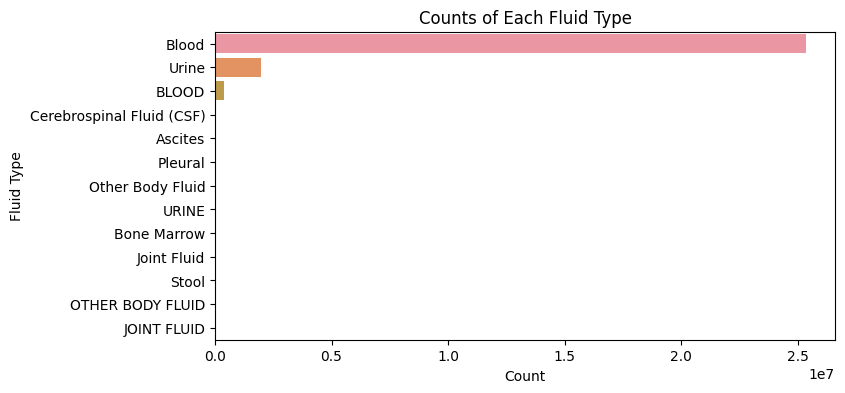

In [ ]:
# Plot fluid counts
plt.figure(figsize=(8, 4))
sns.barplot(y=fluid_counts.index, x=fluid_counts.values)

plt.title('Counts of Each Fluid Type')
plt.xlabel('Count')
plt.ylabel('Fluid Type')
plt.show()

The most common fluid type for lab test is blood.

### 10. MICROBIOLOGYEVENTS.csv

- CHARTDATE: The date the event occurred.
- CHARTTIME: The date and time the event occurred (if available).
- SPEC_ITEMID: Item ID for the specimen type.
- ORG_ITEMID: Item ID for the organism.
- ISOLATE_NUM: Number of organisms isolated from the same sample.
- AB_ITEMID: Item ID for the antibiotic.
- DILUTION_TEXT: Text description of the antibiotic dilution.
- DILUTION_COMPARISON: Comparison used for the antibiotic dilution.
- DILUTION_VALUE: Value of the antibiotic dilution.
- INTERPRETATION: Interpretation of the antibiotic dilution.

In [ ]:
microbiologyevents

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,SPEC_ITEMID,SPEC_TYPE_DESC,ORG_ITEMID,ORG_NAME,ISOLATE_NUM,AB_ITEMID,AB_NAME,DILUTION_TEXT,DILUTION_COMPARISON,DILUTION_VALUE,INTERPRETATION
0,744,96,170324,2156-04-13 00:00:00,2156-04-13 14:18:00,70021.0,BRONCHOALVEOLAR LAVAGE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1,745,96,170324,2156-04-20 00:00:00,2156-04-20 13:10:00,70062.0,SPUTUM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,746,96,170324,2156-04-20 00:00:00,2156-04-20 16:00:00,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,747,96,170324,2156-04-20 00:00:00,NaN,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,748,96,170324,2156-04-20 00:00:00,NaN,70079.0,URINE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631721,630931,99783,126090,2125-11-05 00:00:00,2125-11-05 13:15:00,70076.0,TISSUE,80066.0,ASPERGILLUS FUMIGATUS,2.0,NaN,NaN,NaN,NaN,NaN,NaN
631722,630932,99783,126090,2125-11-06 00:00:00,2125-11-06 10:24:00,70076.0,TISSUE,80066.0,ASPERGILLUS FUMIGATUS,1.0,NaN,NaN,NaN,NaN,NaN,NaN
631723,630933,99783,126090,2125-11-06 00:00:00,2125-11-06 10:24:00,70076.0,TISSUE,80066.0,ASPERGILLUS FUMIGATUS,2.0,NaN,NaN,NaN,NaN,NaN,NaN
631724,630934,99783,126090,2125-11-07 00:00:00,2125-11-07 12:40:00,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
microbiologyevents['ORG_NAME'].nunique()

362

There are 362 unique microorganisms in this dataset. Let's check what's the top 20 most common microorganisms.

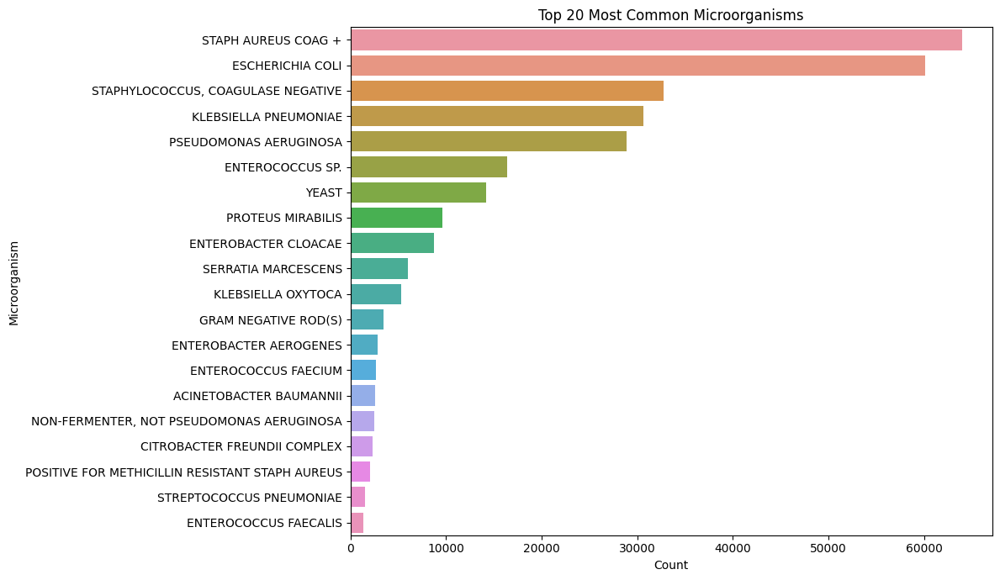

In [ ]:
# Get the top 20 most common microorganisms
top_microorganisms = microbiologyevents['ORG_NAME'].value_counts().head(20)

# Plot
plt.figure(figsize=(12, 7))
sns.barplot(y=top_microorganisms.index, x=top_microorganisms.values)
plt.title('Top 20 Most Common Microorganisms')
plt.xlabel('Count')
plt.ylabel('Microorganism')
plt.tight_layout()
plt.show()

The chart above shows the most common microorganisms are Staphylococcus aureus and Escherichia coli.

A network graph where microorganisms and antibiotics are nodes, and edges represent associations (i.e., which antibiotic is tested against which organism).

In [ ]:
#!pip install networkx

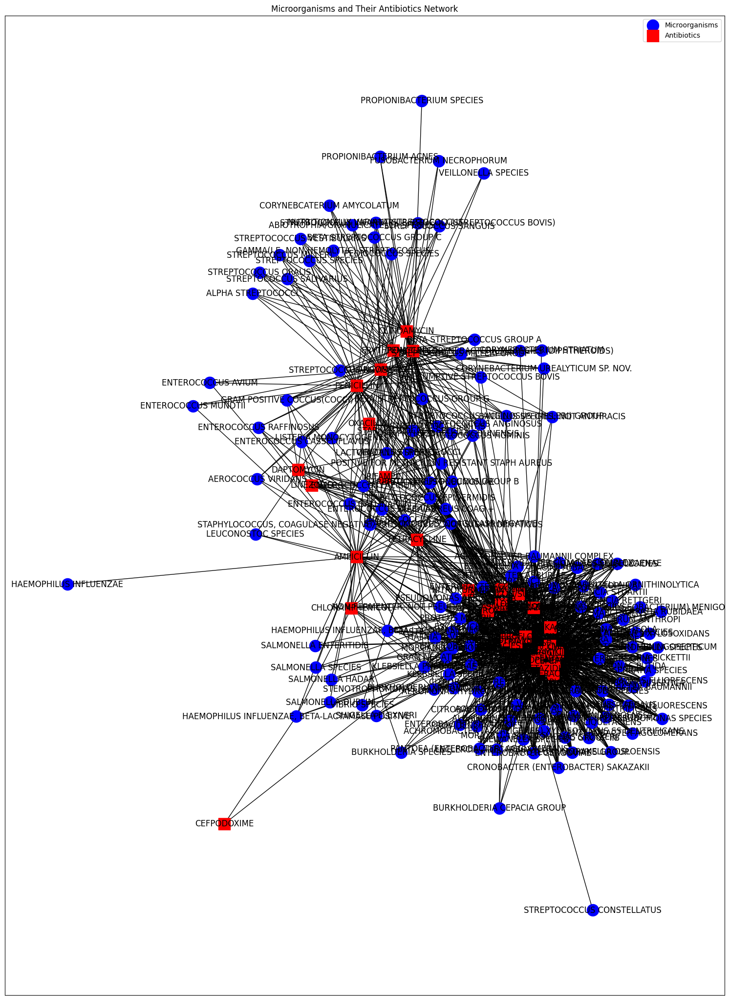

In [ ]:
# Create a new graph
G = nx.Graph()

# Add nodes for each microorganism and antibiotic
for org, ab in microbiologyevents[['ORG_NAME', 'AB_NAME']].dropna().values:
    G.add_node(org, type='organism')
    G.add_node(ab, type='antibiotic')
    G.add_edge(org, ab)

# Draw the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(19, 26))

# Draw organisms
org_nodes = [node for node, data in G.nodes(data=True) if data['type'] == 'organism']
nx.draw_networkx_nodes(G, pos, nodelist=org_nodes, node_color='blue', label='Microorganisms')

# Draw antibiotics
ab_nodes = [node for node, data in G.nodes(data=True) if data['type'] == 'antibiotic']
nx.draw_networkx_nodes(G, pos, nodelist=ab_nodes, node_color='red', label='Antibiotics', node_shape='s')

# Draw edges
nx.draw_networkx_edges(G, pos)

# Draw labels
nx.draw_networkx_labels(G, pos)

plt.title('Microorganisms and Their Antibiotics Network')
plt.legend()
plt.show()

### 11. ICUSTAYS.csv

In [ ]:
#icustays

### 12. NOTEEVENTS.csv

care givers (CGID)

In [ ]:
#noteevents

### Other tables

In [ ]:
#d_items

In [ ]:
#callout

In [ ]:
#caregivers

In [ ]:
#cptevents

In [ ]:
#d_cpt

In [ ]:
#datetimeevents

In [ ]:
#drgcodes

In [ ]:
#inputevents_cv

In [ ]:
#inputevents_mv

In [ ]:
#outputevents

In [ ]:
#prescriptions

In [ ]:
#services

In [ ]:
#transfers

### HAC list
obtained from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8717596/

In [ ]:
hac = pd.read_csv('data/hac_list.csv')
hac

FileNotFoundError: ignored

In [ ]:
# Remove dots from the 'Code' column
hac['Code'] = hac['Code'].replace('.', '', regex=False)

In [ ]:
# Check unique values in the "ICD9_CODE" column of hac DataFrame
unique_hac_codes = hac['Code'].nunique()
unique_hac_codes

In [ ]:
# Find duplicated rows based on "Code" column in hac DataFrame
duplicated_hac_rows = hac[hac.duplicated(subset=['Code'], keep=False)]
duplicated_hac_rows

In [ ]:
# Select only the "ICD9_CODE" and "Description" columns from the hac DataFrame
hac_selected_columns = hac[['Code', 'Description']]

# Remove duplicate rows based on "ICD9_CODE" and "Description" columns
hac_unique = hac_selected_columns.drop_duplicates()

# Remove rows with NaN values from hac_unique DataFrame
hac_unique = hac_unique.dropna()

hac_unique

Merge hac_list with diagnosis_merged

In [ ]:
# Remove dots from the 'ICD9_CODE' column
diagnosis_merged['ICD9_CODE'] = diagnosis_merged['ICD9_CODE'].str.replace('.', '', regex=False)

In [ ]:
# Merge diagnosis_merged with hac using a left merge on ICD9_CODE
hac_merged = pd.merge(diagnosis_merged, hac_unique, left_on='ICD9_CODE', right_on='Code')
hac_merged

No results

In [ ]:
# Filter rows with 'Description' containing 'urinary tract infection'
uti_hac = hac_unique[hac_unique['Description'].str.contains('urinary tract infection', case=False)]
uti_hac

**diagnosis_merged: Filter rows with 'LONG_TITLE' containing 'urinary tract infection'**

In [ ]:
# Filter rows with 'LONG_TITLE' containing 'urinary tract infection'
uti_icd = diagnosis_merged[diagnosis_merged['LONG_TITLE'].notna() & diagnosis_merged['LONG_TITLE'].str.contains('urinary tract infection', case=False)]

In [ ]:
# find unique uti code
unique_uti_icd= uti_icd['ICD9_CODE'].unique()
unique_uti_icd

Noticed that hac_list is using ICD10 code (N390, O862) while MIMIC iii is using ICD9 code (5990, 77182). Hence, we can't merge them.

<div class="alert alert-block alert-info">
<h2>Data Preprocessing</h2>
</div>

Example code to preprocess mimic data suitable for machine learning: https://github.com/MLforHealth/MIMIC_Extract

**admission_merged**

In [ ]:
# print columns in admission_merged
print(admission_merged.columns)

Index(['ROW_ID_x', 'SUBJECT_ID', 'HADM_ID', 'ADMITTIME', 'DISCHTIME',
       'DEATHTIME', 'ADMISSION_TYPE', 'ADMISSION_LOCATION',
       'DISCHARGE_LOCATION', 'INSURANCE', 'LANGUAGE', 'RELIGION',
       'MARITAL_STATUS', 'ETHNICITY', 'EDREGTIME', 'EDOUTTIME', 'DIAGNOSIS',
       'HOSPITAL_EXPIRE_FLAG', 'HAS_CHARTEVENTS_DATA', 'DEATH_STATUS',
       'admission_duration', 'ROW_ID_y', 'GENDER', 'DOB', 'DOD', 'DOD_HOSP',
       'DOD_SSN', 'EXPIRE_FLAG', 'DEATH_HOSP', 'AGE_AT_ADMISSION',
       'admission_duration_days'],
      dtype='object')


In [ ]:
# drop irrelevant columns in admission_merged
columns_to_drop = ['ROW_ID_x', 'ROW_ID_y']

# subset the dataframe
admission_merged = admission_merged.drop(columns=columns_to_drop)

**diagnosis_merged**

In [ ]:
# print columns in diagnosis_merged
print(diagnosis_merged.columns)

Index(['ROW_ID_x', 'SUBJECT_ID', 'HADM_ID', 'SEQ_NUM', 'ICD9_CODE', 'ROW_ID_y',
       'SHORT_TITLE', 'LONG_TITLE'],
      dtype='object')


In [ ]:
# drop irrelevant columns in diagnosis_merged
columns_to_drop = ['ROW_ID_x', 'ROW_ID_y', 'SUBJECT_ID']

# subset the dataframe
diagnosis_merged = diagnosis_merged.drop(columns=columns_to_drop)

**sample a balanced dataset with 1000 admissions (500 UTI and 500 non-UTI)**

In [ ]:
# Set a random seed for reproducibility
seed = 123
np.random.seed(seed)  # Set the random state for numpy

# Extract HADM_IDs from diagnosis_merged where uti is 1
uti_hadm_ids = diagnosis_merged[diagnosis_merged['ICD9_CODE'] == '5990']['HADM_ID'].unique()

# Sample 500 of these HADM_IDs
sampled_uti_hadm_ids = np.random.choice(uti_hadm_ids, size=500, replace=False)

# Use these sampled HADM_IDs to filter both diagnosis_merged and admission_merged for UTI cases
sampled_uti_diagnosis = diagnosis_merged[diagnosis_merged['HADM_ID'].isin(sampled_uti_hadm_ids)].copy()
sampled_uti_admission = admission_merged[admission_merged['HADM_ID'].isin(sampled_uti_hadm_ids)].copy()

# Now, for non-UTI cases, we'll exclude the sampled UTI HADM_IDs and sample 500 others:
non_uti_hadm_ids = diagnosis_merged[(diagnosis_merged['ICD9_CODE'] != '5990') & (~diagnosis_merged['HADM_ID'].isin(sampled_uti_hadm_ids))]['HADM_ID'].unique()
sampled_non_uti_hadm_ids = np.random.choice(non_uti_hadm_ids, size=500, replace=False)

sampled_non_uti_diagnosis = diagnosis_merged[diagnosis_merged['HADM_ID'].isin(sampled_non_uti_hadm_ids)].copy()
sampled_non_uti_admission = admission_merged[admission_merged['HADM_ID'].isin(sampled_non_uti_hadm_ids)].copy()

# Now, combine the UTI and non-UTI samples for both dataframes
final_sampled_diagnosis = pd.concat([sampled_uti_diagnosis, sampled_non_uti_diagnosis], axis=0).reset_index(drop=True)
final_sampled_admission = pd.concat([sampled_uti_admission, sampled_non_uti_admission], axis=0).reset_index(drop=True)

In [ ]:
# # Set a random seed for reproducibility
# seed = 123

# # Filter UTI admissions
# uti_admissions = admission_icd_merged[admission_icd_merged['uti'] == 1].sample(n=500, random_state=seed).copy()

# # Filter non-UTI admissions
# non_uti_admissions = admission_icd_merged[admission_icd_merged['uti'] == 0].sample(n=500, random_state=seed).copy()

# # Combine the two dataframes to get a balanced dataset
# sampled_admission_icd = pd.concat([uti_admissions, non_uti_admissions], axis=0).reset_index(drop=True)

Add SHORT_TITLE to ICD9_CODE

In [ ]:
# Add SHORT_TITLE to ICD9_CODE
final_sampled_diagnosis['ICD9_CODE'] = final_sampled_diagnosis['ICD9_CODE'].astype(str) + ', ' + final_sampled_diagnosis['SHORT_TITLE']

print(final_sampled_diagnosis['ICD9_CODE'])

0         41001, AMI anterolateral, init
1         9982, Accidental op laceration
2         5990, Urin tract infection NOS
3        41401, Crnry athrscl natve vssl
4                 4019, Hypertension NOS
                      ...               
13215     42613, Av block-2nd degree NEC
13216         2875, Thrombocytopenia NOS
13217     E8781, Abn react-artif implant
13218            V4582, Status-post ptca
13219    41401, Crnry athrscl natve vssl
Name: ICD9_CODE, Length: 13220, dtype: object


**Transform the data into a "wide" format where each ICD-9 code is a binary column (indicating presence or absence)**

In [ ]:
# Drop duplicates based on HADM_ID and ICD9_CODE
final_sampled_diagnosis = final_sampled_diagnosis.drop_duplicates(subset=['HADM_ID', 'ICD9_CODE'])
final_sampled_diagnosis = final_sampled_diagnosis.copy()

# Add a column 'present' to sampled_diagnosis to represent the presence of an ICD9_CODE
final_sampled_diagnosis['present'] = 1

# Pivot the dataframe
wide_diagnosis = final_sampled_diagnosis.pivot(index='HADM_ID', columns='ICD9_CODE', values='present')

# Fill NaN with 0 and reset index
wide_diagnosis = wide_diagnosis.fillna(0).reset_index()

<h3> <span style="color:darkorange">  admission_icd_merged </h3> </span>


merge sampled admissions data with diagnosis icd code (wide format)

In [ ]:
# Merge with sampled_admission
admission_icd_merged = pd.merge(final_sampled_admission, wide_diagnosis, on='HADM_ID', how='left')

# Identify columns that should be filled with 0 (i.e., the ICD9 code columns)
icd9_columns = wide_diagnosis.columns.difference(['HADM_ID'])

# Fill NaN values selectively
admission_icd_merged[icd9_columns] = admission_icd_merged[icd9_columns].fillna(0)

**Add target column <span style="color:darkorange">  'uti' </span>**

In [ ]:
admission_icd_merged = admission_icd_merged.rename(columns={'5990, Urin tract infection NOS': 'uti'})

Descriptive statistics for admission_icd_merged

In [ ]:
admission_icd_merged.describe()

SUBJECT_ID        HADM_ID  HOSPITAL_EXPIRE_FLAG  \
count   1000.000000    1000.000000           1000.000000   
mean   35480.192000  150695.211000              0.086000   
std    28464.304226   28630.967062              0.280504   
min       73.000000  100053.000000              0.000000   
25%    13021.500000  127653.750000              0.000000   
50%    25195.000000  150140.500000              0.000000   
75%    56826.500000  175454.500000              0.000000   
max    99819.000000  199973.000000              1.000000   

       HAS_CHARTEVENTS_DATA          admission_duration  EXPIRE_FLAG  \
count           1000.000000                        1000  1000.000000   
mean               0.989000     11 days 16:45:37.320000     0.470000   
std                0.104355  12 days 14:22:42.555321128     0.499349   
min                0.000000           -1 days +16:28:00     0.000000   
25%                1.000000             4 days 17:04:15     0.000000   
50%                1.000000             8 days 01:46:30     0.000000   
75%                1.000000            14 days 00:36:15     1.000000   
max                1.000000           151 days 10:22:00     1.000000   

       AGE_AT_ADMISSION  admission_duration_days          NaN  \
count        922.000000              1000.000000  1000.000000   
mean          65.612798                11.698349     0.269000   
std           15.472604                12.599104     0.443662   
min           18.000000                -0.313889     0.000000   
25%           57.000000                 4.711285     0.000000   
50%           67.000000                 8.073958     0.000000   
75%           78.000000                14.025174     1.000000   
max           88.000000               151.431944     1.000000   

       00845, Int inf clstrdium dfcile  0088, Viral enteritis NOS  \
count                      1000.000000                1000.000000   
mean                          0.040000                   0.001000   
std                           0.196057                   0.031623   
min                           0.000000                   0.000000   
25%                           0.000000                   0.000000   
50%                           0.000000                   0.000000   
75%                           0.000000                   0.000000   
max                           1.000000                   1.000000   

       0380, Streptococcal septicemia  03810, Staphylcocc septicem NOS  \
count                     1000.000000                      1000.000000   
mean                         0.007000                         0.002000   
std                          0.083414                         0.044699   
min                          0.000000                         0.000000   
25%                          0.000000                         0.000000   
50%                          0.000000                         0.000000   
75%                          0.000000                         0.000000   
max                          1.000000                         1.000000   

       03811, Meth susc Staph aur sept  03812, MRSA septicemia  \
count                      1000.000000             1000.000000   
mean                          0.009000                0.005000   
std                           0.094488                0.070569   
min                           0.000000                0.000000   
25%                           0.000000                0.000000   
50%                           0.000000                0.000000   
75%                           0.000000                0.000000   
max                           1.000000                1.000000   

       03819, Staphylcocc septicem NEC  0383, Anaerobic septicemia  \
count                      1000.000000                 1000.000000   
mean                          0.002000                    0.002000   
std                           0.044699                    0.044699   
min                           0.000000                    0.000000   

**Plot correlation matrix**

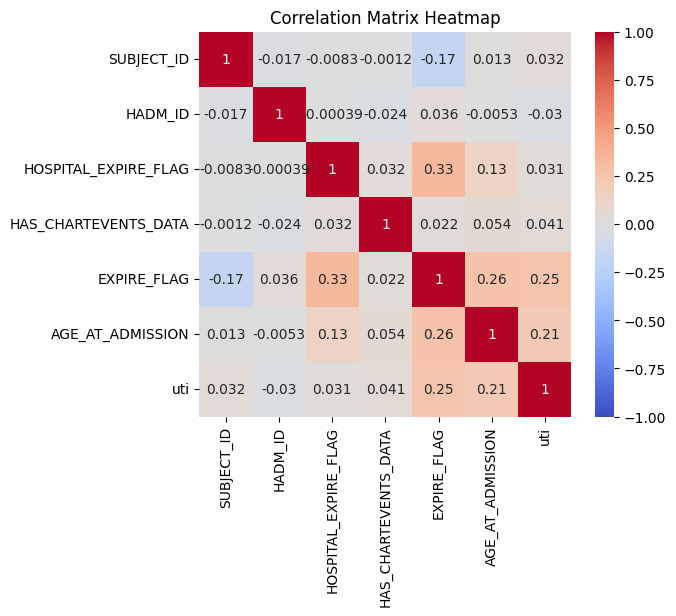

In [ ]:
columns_to_retain = ["SUBJECT_ID", "HADM_ID", "ADMITTIME", "DISCHTIME", "DEATHTIME", "ADMISSION_TYPE",
                     "ADMISSION_LOCATION", "DISCHARGE_LOCATION", "INSURANCE", "LANGUAGE", "RELIGION",
                     "MARITAL_STATUS", "ETHNICITY", "EDREGTIME", "EDOUTTIME", "DIAGNOSIS",
                     "HOSPITAL_EXPIRE_FLAG", "HAS_CHARTEVENTS_DATA", "admission_duration", "DEATH_STATUS",
                     "GENDER", "DOB", "DOD", "DOD_HOSP", "DOD_SSN", "EXPIRE_FLAG", "DEATH_HOSP",
                     "AGE_AT_ADMISSION", "uti"]

admission_icd_filtered = admission_icd_merged[columns_to_retain]

# compute correlation matrix
correlation_matrix = admission_icd_filtered.corr()

# plotting the correlation matrix using heatmap
plt.figure(figsize=(6,5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [ ]:
# Displaying the Exact Numbers
correlation_matrix

,SUBJECT_ID,HADM_ID,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA,EXPIRE_FLAG,AGE_AT_ADMISSION,uti
SUBJECT_ID,1.000000,-0.016583,-0.008283,-0.001184,-0.174772,0.013449,0.032122
HADM_ID,-0.016583,1.000000,-0.000389,-0.023988,0.036473,-0.005271,-0.030401
HOSPITAL_EXPIRE_FLAG,-0.008283,-0.000389,1.000000,0.032350,0.325736,0.127891,0.030646
HAS_CHARTEVENTS_DATA,-0.001184,-0.023988,0.032350,1.000000,0.022475,0.053870,0.040610
EXPIRE_FLAG,-0.174772,0.036473,0.325736,0.022475,1.000000,0.263198,0.254601
AGE_AT_ADMISSION,0.013449,-0.005271,0.127891,0.053870,0.263198,1.000000,0.214049
uti,0.032122,-0.030401,0.030646,0.040610,0.254601,0.214049,1.000000


**Preprocess timestamp data**

Machine learning models require numerical input and cannot handle date/time objects directly. To fix this, we'll need to convert these Timestamp columns to numerical representations. One common method is to convert them to the number of seconds since some reference point (like the UNIX timestamp).

In [ ]:
# display data types
print(admission_icd_merged.iloc[:, :30].dtypes)

SUBJECT_ID                           int64
HADM_ID                              int64
ADMITTIME                   datetime64[ns]
DISCHTIME                   datetime64[ns]
DEATHTIME                           object
ADMISSION_TYPE                      object
ADMISSION_LOCATION                  object
DISCHARGE_LOCATION                  object
INSURANCE                           object
LANGUAGE                            object
RELIGION                            object
MARITAL_STATUS                      object
ETHNICITY                           object
EDREGTIME                           object
EDOUTTIME                           object
DIAGNOSIS                           object
HOSPITAL_EXPIRE_FLAG                 int64
HAS_CHARTEVENTS_DATA                 int64
DEATH_STATUS                        object
admission_duration         timedelta64[ns]
GENDER                              object
DOB                         datetime64[ns]
DOD                                 object
DOD_HOSP   

In [ ]:
timestamp_cols = ['ADMITTIME', 'DISCHTIME', 'DEATHTIME', 'EDREGTIME', 'EDOUTTIME', 'DOB', 'DOD', 'DOD_HOSP', 'DOD_SSN', 'admission_duration']

reference_time = pd.Timestamp('1970-01-01')

for col in timestamp_cols:
    # Convert to datetime if necessary
    if admission_icd_merged[col].dtype == 'float64':
        # Assuming they are UNIX timestamps
        admission_icd_merged[col] = pd.to_datetime(admission_icd_merged[col], unit='s', errors='coerce')
    elif admission_icd_merged[col].dtype == 'object':
        admission_icd_merged[col] = pd.to_datetime(admission_icd_merged[col], errors='coerce')

    # Subtract reference_time only if the column dtype is datetime64[ns]
    if admission_icd_merged[col].dtype == 'datetime64[ns]':
        admission_icd_merged[col] = (admission_icd_merged[col] - reference_time).dt.total_seconds()


drop admission_duration in timedelta64[ns] format. We have admission_duration_days that represents the same thing.

In [ ]:
admission_icd_merged = admission_icd_merged.drop(columns='admission_duration')

In [ ]:
print(admission_icd_merged.iloc[:, :30].dtypes)

SUBJECT_ID                           int64
HADM_ID                              int64
ADMITTIME                          float64
DISCHTIME                          float64
DEATHTIME                          float64
ADMISSION_TYPE                      object
ADMISSION_LOCATION                  object
DISCHARGE_LOCATION                  object
INSURANCE                           object
LANGUAGE                            object
RELIGION                            object
MARITAL_STATUS                      object
ETHNICITY                           object
EDREGTIME                          float64
EDOUTTIME                          float64
DIAGNOSIS                           object
HOSPITAL_EXPIRE_FLAG                 int64
HAS_CHARTEVENTS_DATA                 int64
DEATH_STATUS                        object
GENDER                              object
DOB                                float64
DOD                                float64
DOD_HOSP                           float64
DOD_SSN    

**Handle missing values**

Random forest does not support input data with missing values.

In [ ]:
missing_values = admission_icd_merged.isnull().sum()
print(missing_values.iloc[0:30])

SUBJECT_ID                           0
HADM_ID                              0
ADMITTIME                            0
DISCHTIME                            0
DEATHTIME                          914
ADMISSION_TYPE                       0
ADMISSION_LOCATION                   0
DISCHARGE_LOCATION                   0
INSURANCE                            0
LANGUAGE                           400
RELIGION                             7
MARITAL_STATUS                     113
ETHNICITY                            0
EDREGTIME                          383
EDOUTTIME                          383
DIAGNOSIS                            1
HOSPITAL_EXPIRE_FLAG                 0
HAS_CHARTEVENTS_DATA                 0
DEATH_STATUS                         0
GENDER                               0
DOB                                  0
DOD                                530
DOD_HOSP                           716
DOD_SSN                            588
EXPIRE_FLAG                          0
DEATH_HOSP               

For categorical variable, replace NaN with 'missing_value'.

In [ ]:
admission_icd_merged['LANGUAGE'].fillna('missing_value', inplace=True)
admission_icd_merged['MARITAL_STATUS'].fillna('missing_value', inplace=True)

For the AGE_AT_ADMISSION column, replace NaN values with the median.

In [ ]:
median_age = admission_icd_merged['AGE_AT_ADMISSION'].median()
admission_icd_merged['AGE_AT_ADMISSION'].fillna(median_age, inplace=True)

For the death related columns, we already have DEATH_STATUS and EXPIRE_FLAG categorical variables, so we can drop them. EDREGTIME and EDOUTTIME can be dropped too.

In [ ]:
admission_icd_merged.drop(columns=['DEATHTIME', 'DOD', 'DOD_HOSP', 'DOD_SSN', 'EDREGTIME', 'EDOUTTIME'], inplace=True)

# Merge with mircrobiology, lab, procedure

In [ ]:
### Preprocess microbiologyevents ###

# Subset HADM_ID and ORG_NAME from microbiologyevents
micro_subset = microbiologyevents[["HADM_ID", "ORG_NAME"]]

# remove rows where ORG_NAME column has NaN values.
micro_subset = micro_subset.dropna(subset=['ORG_NAME'])

# remove duplicate rows based on both "HADM_ID" and "ORG_NAME"
micro_subset = micro_subset.drop_duplicates(subset=["HADM_ID", "ORG_NAME"])
micro_subset = micro_subset.copy()

# Add a column 'present' to micro_subset to represent the presence of an ORG_NAME
micro_subset['present'] = 1

# Pivot the dataframe
wide_micro = micro_subset.pivot(index='HADM_ID', columns='ORG_NAME', values='present')

# Fill NaN with 0 and reset index
wide_micro = wide_micro.fillna(0).reset_index()


# Merge into admission_icd_merged
admission_icd_micro_merged = pd.merge(admission_icd_merged, wide_micro, on='HADM_ID', how='left')

# Identify columns that should be filled with 0 (i.e., the columns introduced from wide_micro)
micro_columns = wide_micro.columns.difference(['HADM_ID'])

# Fill NaN values selectively for micro_columns
admission_icd_micro_merged[micro_columns] = admission_icd_micro_merged[micro_columns].fillna(0)

In [ ]:
### Preprocess procedure_merged ###

# Subset HADM_ID and SHORT_TITLE from procedure_merged
procedure_subset = procedure_merged[["HADM_ID", "SHORT_TITLE"]]

# remove duplicate rows based on both "HADM_ID" and "SHORT_TITLE"
procedure_subset = procedure_subset.drop_duplicates(subset=["HADM_ID", "SHORT_TITLE"])
procedure_subset = procedure_subset.copy()

# Add a column 'present' to procedure_subset to represent the presence of a SHORT_TITLE
procedure_subset['present'] = 1

# Pivot the dataframe
wide_procedure = procedure_subset.pivot(index='HADM_ID', columns='SHORT_TITLE', values='present')

# Fill NaN with 0 and reset index
wide_procedure = wide_procedure.fillna(0).reset_index()

# Ensure no column named NaN in wide_procedure
wide_procedure.columns = [col if col is not np.nan else "unexpected_nan" for col in wide_procedure.columns]

# Merge into admission_icd_micro_merged
admission_icd_micro_procedure_merged = pd.merge(admission_icd_micro_merged, wide_procedure, on='HADM_ID', how='left')

# Identify columns that should be filled with 0 (i.e., the columns introduced from wide_procedure)
procedure_columns = wide_procedure.columns.difference(['HADM_ID'])

# Fill NaN values selectively for procedure_columns
admission_icd_micro_procedure_merged[procedure_columns] = admission_icd_micro_procedure_merged[procedure_columns].fillna(0)
admission_icd_micro_procedure_merged

SUBJECT_ID  HADM_ID     ADMITTIME     DISCHTIME ADMISSION_TYPE  \
0           357   145674  7.213467e+09  7.220847e+09      EMERGENCY   
1           362   142749  4.497561e+09  4.498120e+09      EMERGENCY   
2            73   194730  6.342106e+09  6.342494e+09      EMERGENCY   
3           149   154869  5.211113e+09  5.211796e+09      EMERGENCY   
4           109   139061  5.418181e+09  5.418475e+09      EMERGENCY   
..          ...      ...           ...           ...            ...   
995       99791   175690  6.319930e+09  6.320478e+09      EMERGENCY   
996       93844   188035  5.504949e+09  5.505475e+09      EMERGENCY   
997       93554   160100  5.906815e+09  5.907575e+09      EMERGENCY   
998       93560   140159  5.883608e+09  5.884590e+09       ELECTIVE   
999       98800   191113  5.088345e+09  5.088582e+09      EMERGENCY   

            ADMISSION_LOCATION        DISCHARGE_LOCATION INSURANCE  \
0         EMERGENCY ROOM ADMIT  REHAB/DISTINCT PART HOSP   Private   
1         EMERGENCY ROOM ADMIT                       SNF  Medicare   
2    TRANSFER FROM HOSP/EXTRAM                      HOME   Private   
3    CLINIC REFERRAL/PREMATURE                       SNF  Medicare   
4         EMERGENCY ROOM ADMIT          HOME HEALTH CARE  Medicaid   
..                         ...                       ...       ...   
995  CLINIC REFERRAL/PREMATURE          HOME HEALTH CARE  Medicare   
996  CLINIC REFERRAL/PREMATURE                      HOME   Private   
997  CLINIC REFERRAL/PREMATURE          HOME HEALTH CARE  Medicare   
998  PHYS REFERRAL/NORMAL DELI  REHAB/DISTINCT PART HOSP   Private   
999  CLINIC REFERRAL/PREMATURE                      HOME   Private   

          LANGUAGE       RELIGION MARITAL_STATUS               ETHNICITY  \
0             ENGL  NOT SPECIFIED        MARRIED                   WHITE   
1    missing_value   UNOBTAINABLE        WIDOWED                   WHITE   
2    missing_value       CATHOLIC        MARRIED                   WHITE   
3    missing_value         JEWISH        WIDOWED                   WHITE   
4             ENGL  NOT SPECIFIED         SINGLE  BLACK/AFRICAN AMERICAN   
..             ...            ...            ...                     ...   
995           ENGL  NOT SPECIFIED        MARRIED                   WHITE   
996           SPAN       CATHOLIC        MARRIED      HISPANIC OR LATINO   
997           ENGL       CATHOLIC        WIDOWED                   WHITE   
998           ENGL       CATHOLIC         SINGLE                   WHITE   
999           ENGL  NOT SPECIFIED         SINGLE                   WHITE   

                                             DIAGNOSIS  HOSPITAL_EXPIRE_FLAG  \
0                                              SEIZURE                     0   
1    HYPONATREMIA-R/O MYOCARDIAL INFARCTION-RHABDOM...                     0   
2                          ACUTE MYOCARDIAL INFARCTION                     0   
3                              CORONARY ARTERY DISEASE                     0   
4                                         HYPERTENSION                     0   
..                                                 ...                   ...   
995  BILARY STONES W/ RECURRENT CHOLECYSTITIS/SDA\B...                     0   
996                                     ABDOMINAL PAIN                     0   
997                                     LOWER GI BLEED                     0   
998              TRAUMATIC BRAIN HEMORRHAGE, LEFT /SDA                     0   
999                                             TRAUMA                     0   

     HAS_CHARTEVENTS_DATA DEATH_STATUS GENDER           DOB  EXPIRE_FLAG  \
0                       1        Alive      M  5.213808e+09            1   
1                       1        Alive      F  1.790122e+09            1   
2                       1        Alive      F  4.524854e+09            0   
3                       1        Alive      F -4.256064e+09            1   
4                       1        Alive      F  4.657738e+

In [ ]:
### Preprocess lab_merged ###

# Subset HADM_ID, LABEL and FLAG from lab_merged
lab_subset = lab_merged[["HADM_ID", "LABEL", "FLAG"]]

# Filter the rows where the FLAG is "abnormal".
lab_subset = lab_subset[lab_subset["FLAG"] == "abnormal"]

# Select only the HADM_ID and LABEL columns, and then rename them:
lab_subset = lab_subset[["HADM_ID", "LABEL"]]
lab_subset.columns = ["HADM_ID", "lab_flag"]

# remove duplicate rows based on both "HADM_ID" and "lab_flag"
lab_subset = lab_subset.drop_duplicates(subset=["HADM_ID", "lab_flag"])
lab_subset = lab_subset.copy()

# Add a column 'present' to lab_subset to represent the presence of a lab_flag
lab_subset['present'] = 1

# Pivot the dataframe
wide_lab = lab_subset.pivot(index='HADM_ID', columns='lab_flag', values='present')

# Fill NaN with 0 and reset index
wide_lab = wide_lab.fillna(0).reset_index()
wide_lab

# Merge into admission_icd_micro_procedure_merged
admission_icd_micro_procedure_lab_merged = pd.merge(admission_icd_micro_procedure_merged, wide_lab, on='HADM_ID', how='left')

# Identify columns that should be filled with 0
lab_columns = wide_lab.columns.difference(['HADM_ID'])

# Fill NaN values selectively for procedure_columns
admission_icd_micro_procedure_lab_merged[lab_columns] = admission_icd_micro_procedure_lab_merged[lab_columns].fillna(0)
admission_icd_micro_procedure_lab_merged

SUBJECT_ID  HADM_ID     ADMITTIME     DISCHTIME ADMISSION_TYPE  \
0           357   145674  7.213467e+09  7.220847e+09      EMERGENCY   
1           362   142749  4.497561e+09  4.498120e+09      EMERGENCY   
2            73   194730  6.342106e+09  6.342494e+09      EMERGENCY   
3           149   154869  5.211113e+09  5.211796e+09      EMERGENCY   
4           109   139061  5.418181e+09  5.418475e+09      EMERGENCY   
..          ...      ...           ...           ...            ...   
995       99791   175690  6.319930e+09  6.320478e+09      EMERGENCY   
996       93844   188035  5.504949e+09  5.505475e+09      EMERGENCY   
997       93554   160100  5.906815e+09  5.907575e+09      EMERGENCY   
998       93560   140159  5.883608e+09  5.884590e+09       ELECTIVE   
999       98800   191113  5.088345e+09  5.088582e+09      EMERGENCY   

            ADMISSION_LOCATION        DISCHARGE_LOCATION INSURANCE  \
0         EMERGENCY ROOM ADMIT  REHAB/DISTINCT PART HOSP   Private   
1         EMERGENCY ROOM ADMIT                       SNF  Medicare   
2    TRANSFER FROM HOSP/EXTRAM                      HOME   Private   
3    CLINIC REFERRAL/PREMATURE                       SNF  Medicare   
4         EMERGENCY ROOM ADMIT          HOME HEALTH CARE  Medicaid   
..                         ...                       ...       ...   
995  CLINIC REFERRAL/PREMATURE          HOME HEALTH CARE  Medicare   
996  CLINIC REFERRAL/PREMATURE                      HOME   Private   
997  CLINIC REFERRAL/PREMATURE          HOME HEALTH CARE  Medicare   
998  PHYS REFERRAL/NORMAL DELI  REHAB/DISTINCT PART HOSP   Private   
999  CLINIC REFERRAL/PREMATURE                      HOME   Private   

          LANGUAGE       RELIGION MARITAL_STATUS               ETHNICITY  \
0             ENGL  NOT SPECIFIED        MARRIED                   WHITE   
1    missing_value   UNOBTAINABLE        WIDOWED                   WHITE   
2    missing_value       CATHOLIC        MARRIED                   WHITE   
3    missing_value         JEWISH        WIDOWED                   WHITE   
4             ENGL  NOT SPECIFIED         SINGLE  BLACK/AFRICAN AMERICAN   
..             ...            ...            ...                     ...   
995           ENGL  NOT SPECIFIED        MARRIED                   WHITE   
996           SPAN       CATHOLIC        MARRIED      HISPANIC OR LATINO   
997           ENGL       CATHOLIC        WIDOWED                   WHITE   
998           ENGL       CATHOLIC         SINGLE                   WHITE   
999           ENGL  NOT SPECIFIED         SINGLE                   WHITE   

                                             DIAGNOSIS  HOSPITAL_EXPIRE_FLAG  \
0                                              SEIZURE                     0   
1    HYPONATREMIA-R/O MYOCARDIAL INFARCTION-RHABDOM...                     0   
2                          ACUTE MYOCARDIAL INFARCTION                     0   
3                              CORONARY ARTERY DISEASE                     0   
4                                         HYPERTENSION                     0   
..                                                 ...                   ...   
995  BILARY STONES W/ RECURRENT CHOLECYSTITIS/SDA\B...                     0   
996                                     ABDOMINAL PAIN                     0   
997                                     LOWER GI BLEED                     0   
998              TRAUMATIC BRAIN HEMORRHAGE, LEFT /SDA                     0   
999                                             TRAUMA                     0   

     HAS_CHARTEVENTS_DATA DEATH_STATUS GENDER           DOB  EXPIRE_FLAG  \
0                       1        Alive      M  5.213808e+09            1   
1                       1        Alive      F  1.790122e+09            1   
2                       1        Alive      F  4.524854e+09            0   
3                       1        Alive      F -4.256064e+09            1   
4                       1        Alive      F  4.657738e+

**One-hot encoding for all categorical variables.**

In [ ]:
encoded_df = pd.get_dummies(admission_icd_micro_procedure_lab_merged, columns=None, drop_first=False)

**Convert all feature names to strings before fitting to random forest.**

In [ ]:
encoded_df.columns = encoded_df.columns.astype(str)

**Remove SUBJECT_ID and HADM_ID before model training.**

In [ ]:
encoded_df = encoded_df.drop(['SUBJECT_ID', 'HADM_ID'], axis=1)

In [ ]:
encoded_df

,ADMITTIME,DISCHTIME,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA,DOB,EXPIRE_FLAG,AGE_AT_ADMISSION,admission_duration_days,nan,"00845, Int inf clstrdium dfcile","0088, Viral enteritis NOS","0380, Streptococcal septicemia","03810, Staphylcocc septicem NOS","03811, Meth susc Staph aur sept","03812, MRSA septicemia","03819, Staphylcocc septicem NEC","0383, Anaerobic septicemia","03840, Gram-neg septicemia NOS","03842, E coli septicemia","03843, Pseudomonas septicemia","03849, Gram-neg septicemia NEC","0388, Septicemia NEC","0389, Septicemia NOS","0400, Gas gangrene","04100, Streptococcus unspecf","04101, Streptococcus group a","04102, Streptococcus group b","04104, Enterococcus group d","04109, Other streptococcus","04110, Staphylococcus unspcfied","04111, Mth sus Stph aur els/NOS","04112, MRSA elsewhere/NOS","04119, Other staphylococcus","0413, Klebsiella pneumoniae","04149, E.coli infection NEC/NOS","0416, Proteus infection NOS","0417, Pseudomonas infect NOS","04184, Other anaerobes","04185, Oth gram negatv bacteria","04186, Helicobacter pylori","04189, Oth specf bacteria","0419, Bacterial infection NOS","042, Human immuno virus dis","0478, Viral meningitis NEC","0498, Viral encephalitis NEC","0499, Viral encephalitis NOS","05312, Postherpes trigem neural","0539, Herpes zoster NOS","0543, Herpetic encephalitis","05479, H simplex complicat NEC","0549, Herpes simplex NOS","07030, Hpt B acte wo cm wo dlta","07032, Hpt B chrn wo cm wo dlta","07033, Hpt B chrn wo cm w dlta","07041, Hpt C acute w hepat Coma","07044, Chrnc hpt C w hepat Coma","07054, Chrnc hpt C wo hpat coma","07070, Hpt C w/o hepat coma NOS","07071, Hpt C w hepatic coma NOS","0785, Cytomegaloviral disease","07989, Oth specf viral infectn","08881, Lyme disease","0931, Syphilitic aortitis","0949, Neurosyphilis NOS","0971, Latent syphilis NOS","1101, Dermatophytosis of nail","1103, Dermatophytosis of groin","1104, Dermatophytosis of foot","1105, Dermatophytosis of body","1108, Dermatophytosis site NEC","1120, Thrush","1121, Candidal vulvovaginitis","1122, Candidias urogenital NEC","1123, Cutaneous candidiasis","1125, Disseminated candidiasis","11284, Candidal esophagitis","11289, Candidiasis site NEC","1175, Cryptococcosis","1179, Mycoses NEC & NOS","1272, Strongyloidiasis","1309, Toxoplasmosis NOS","135, Sarcoidosis","1363, Pneumocystosis","138, Late effect acute polio","1398, Late eff infect dis NEC","1505, Mal neo lower 3rd esoph","1508, Mal neo esophagus NEC","1509, Mal neo esophagus NOS","1510, Mal neo stomach cardia","1518, Malig neopl stomach NEC","1530, Mal neo hepatic flexure","1531, Mal neo transverse colon","1533, Mal neo sigmoid colon","1541, Malignant neopl rectum","1548, Mal neo rectum/anus NEC","1550, Mal neo liver, primary","1562, Mal neo ampulla of vater","1570, Mal neo pancreas head","1572, Mal neo pancreas tail","1578, Malig neo pancreas NEC","1580, Mal neo retroperitoneum","1618, Malignant neo larynx NEC","1623, Mal neo upper lobe lung","1625, Mal neo lower lobe lung","1628, Mal neo bronch/lung NEC","1629, Mal neo bronch/lung NOS","1714, Mal neo soft tis thorax","1729, Malig melanoma skin NOS","1748, Malign neopl breast NEC","1749, Malign neopl breast NOS","1769, Kaposi's sarcoma NOS","185, Malign neopl prostate","1874, Malig neo penis NOS","1888, Malig neo bladder NEC","1889, Malig neo bladder NOS","1890, Malig neopl kidney","1911, Malig neo frontal lobe","1915, Mal neo cereb ventricle","1918, Malig neo brain NEC","193, Malign neopl thyroid","1950, Mal neo head/face/neck","1952, Malig neo abdomen","1960, Mal neo lymph-head/neck","1961, Mal neo lymph-intrathor","1962, Mal neo lymph intra-abd","1966, Mal neo lymph-intrapelv","1970, Secondary malig neo lung","1971, Sec mal neo mediastinum","1972, Second malig neo pleura","1973, Sec malig neo resp NEC","1975, Sec malig neo lg bowel","1976, Sec mal neo peritoneum","1977, Second malig neo liver","1980, Second malig neo kidney","1981, Sec malig neo urin NEC","1983, Sec mal neo brain/spine","1984, Sec malig ne

### Use ClinicalBERT model by Hugging Face to process the 'noteevents' data.

In [ ]:
# # Compute the lengths of the TEXT field
# noteevents['text_length'] = noteevents['TEXT'].str.len()

# # Find the maximum length
# max_length = noteevents['text_length'].max()

# # Find the average length
# avg_length = noteevents['text_length'].mean()

# print(f"Maximum length of TEXT: {max_length}")
# print(f"Average length of TEXT: {avg_length:.2f}")

Use 2500 max length

In [ ]:
#! pip install transformers torch

In [ ]:
#from transformers import BertTokenizer, BertModel

# Load the tokenizer and model
# tokenizer = BertTokenizer.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")
# model = BertModel.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")

In [ ]:
# # Tokenize and process the notes
# def embed_text(text):
#     # Tokenize text (add special tokens and pad/truncate)
#     inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=2500)

#     # Get embeddings
#     with torch.no_grad():
#         outputs = model(**inputs)

#     # Get the [CLS] token embeddings which can be used as sentence embeddings
#     embeddings = outputs.last_hidden_state[:, 0, :].numpy()

#     return embeddings

# noteevents['embeddings'] = noteevents['TEXT'].apply(embed_text)


### Autoencoder followed by UMAP to visualise latent space

1. Preprocess the Data: Most columns in the admission_merged table seem to be of a non-numeric type. We'll need to preprocess the data to convert non-numeric fields into a format suitable for training. One of the common techniques is to use one-hot encoding for categorical data. However, be cautious with date fields and fields with a large number of unique values, as one-hot encoding might not be the best choice for them.

2. Build an Autoencoder: We'll use Keras for this.

3. Train the Autoencoder.

4. Extract Latent Features.

5. Apply UMAP.

6. Visualize the Results.

Autoencoder example notebook: https://github.com/ageron/handson-ml3/blob/main/17_autoencoders_gans_and_diffusion_models.ipynb

Let's build and train a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [ ]:
# tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

# stacked_encoder = tf.keras.Sequential([
#     tf.keras.layers.Flatten(),
#     tf.keras.layers.Dense(100, activation="relu"),
#     tf.keras.layers.Dense(30, activation="relu"),
# ])
# stacked_decoder = tf.keras.Sequential([
#     tf.keras.layers.Dense(100, activation="relu"),
#     tf.keras.layers.Dense(28 * 28),
#     tf.keras.layers.Reshape([28, 28])
# ])
# stacked_ae = tf.keras.Sequential([stacked_encoder, stacked_decoder])

# stacked_ae.compile(loss="mse", optimizer="nadam")
# history = stacked_ae.fit(X_train, X_train, epochs=20,
#                          validation_data=(X_valid, X_valid))

TSNE

In [ ]:
# from sklearn.manifold import TSNE

# X_valid_compressed = stacked_encoder.predict(X_valid)
# tsne = TSNE(init="pca", learning_rate="auto", random_state=42)
# X_valid_2D = tsne.fit_transform(X_valid_compressed)

In [ ]:
# plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
# plt.show()

In [ ]:
# # extra code – beautifies the previous diagram

# import matplotlib as mpl

# plt.figure(figsize=(10, 8))
# cmap = plt.cm.tab10
# Z = X_valid_2D
# Z = (Z - Z.min()) / (Z.max() - Z.min())  # normalize to the 0-1 range
# plt.scatter(Z[:, 0], Z[:, 1], c=y_valid, s=10, cmap=cmap)
# image_positions = np.array([[1., 1.]])
# for index, position in enumerate(Z):
#     dist = ((position - image_positions) ** 2).sum(axis=1)
#     if dist.min() > 0.02: # if far enough from other images
#         image_positions = np.r_[image_positions, [position]]
#         imagebox = mpl.offsetbox.AnnotationBbox(
#             mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
#             position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
#         plt.gca().add_artist(imagebox)

# plt.axis("off")
# #save_fig("visualization_plot")
# plt.show()

In [ ]:
# Separate features from the target. We'll use the features to train the autoencoder.
X = encoded_df.drop('uti', axis=1)

Scale before encoder

In [ ]:
from sklearn.preprocessing import StandardScaler

# Original data
scaler_original = StandardScaler()
X_scaled = scaler_original.fit_transform(X)

Build Autoencoder

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

encoding_dim = 100  # adjust this based on requirements

# Define input layer
input_layer = Input(shape=(X.shape[1],))

# Define encoding layer
encoded = Dense(encoding_dim, activation='relu')(input_layer)

# Define decoding layer
decoded = Dense(X.shape[1], activation='sigmoid')(encoded)

# Create autoencoder model
autoencoder = Model(input_layer, decoded)


Compile and train autoencoder

In [ ]:
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

autoencoder.fit(X, X,  # Both input and target are X
                epochs=50,
                batch_size=256,
                shuffle=True)

Epoch 1/50
4/4 [==============================] - 1s 33ms/step - loss: -71459363880960.0000
Epoch 2/50
4/4 [==============================] - 0s 21ms/step - loss: -289866168401920.0000
Epoch 3/50
4/4 [==============================] - 0s 18ms/step - loss: -542811757740032.0000
Epoch 4/50
4/4 [==============================] - 0s 18ms/step - loss: -857202927599616.0000
Epoch 5/50
4/4 [==============================] - 0s 19ms/step - loss: -1257063107788800.0000
Epoch 6/50
4/4 [==============================] - 0s 16ms/step - loss: -1770718245158912.0000
Epoch 7/50
4/4 [==============================] - 0s 17ms/step - loss: -2396685166706688.0000
Epoch 8/50
4/4 [==============================] - 0s 17ms/step - loss: -3172806426624000.0000
Epoch 9/50
4/4 [==============================] - 0s 16ms/step - loss: -4094819135651840.0000
Epoch 10/50
4/4 [==============================] - 0s 16ms/step - loss: -5189804941639680.0000
Epoch 11/50
4/4 [==============================] - 0s 16ms/step 

Encode data

In [ ]:
encoder = Model(input_layer, encoded)
X_encoded = encoder.predict(X)

32/32 [==============================] - 0s 2ms/step


Neural Network (MLP)

In [ ]:
#Scaling the X_encoded before training the neural network:
from sklearn.model_selection import train_test_split

scaler_encoded = StandardScaler()
X_encoded_scaled = scaler_encoded.fit_transform(X_encoded)

y = encoded_df['uti'].values

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_encoded_scaled, y, test_size=0.2, random_state=42)


In [ ]:
# Build the neural network model
from tensorflow.keras.layers import Dropout

input_layer = Input(shape=(X_encoded.shape[1],))
hidden_layer = Dense(50, activation='relu')(input_layer)
dropout_layer = Dropout(0.5)(hidden_layer)
output_layer = Dense(1, activation='sigmoid')(dropout_layer)

model = Model(inputs=input_layer, outputs=output_layer)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy*100:.2f}%")

Epoch 1/50
25/25 [==============================] - 1s 11ms/step - loss: 0.8425 - accuracy: 0.4875 - val_loss: 0.6701 - val_accuracy: 0.5950
Epoch 2/50
25/25 [==============================] - 0s 3ms/step - loss: 0.7160 - accuracy: 0.5300 - val_loss: 0.6666 - val_accuracy: 0.5600
Epoch 3/50
25/25 [==============================] - 0s 3ms/step - loss: 0.7079 - accuracy: 0.5275 - val_loss: 0.6713 - val_accuracy: 0.5900
Epoch 4/50
25/25 [==============================] - 0s 3ms/step - loss: 0.7094 - accuracy: 0.5200 - val_loss: 0.6732 - val_accuracy: 0.6000
Epoch 5/50
25/25 [==============================] - 0s 3ms/step - loss: 0.6881 - accuracy: 0.5325 - val_loss: 0.6750 - val_accuracy: 0.5600
Epoch 6/50
25/25 [==============================] - 0s 3ms/step - loss: 0.6880 - accuracy: 0.5300 - val_loss: 0.6633 - val_accuracy: 0.6300
Epoch 7/50
25/25 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.5325 - val_loss: 0.6646 - val_accuracy: 0.6150
Epoch 8/50
25/25 [=

### Clustering

<div class="alert alert-block alert-info">
<h2>Model Training and Evaluation</h2>
</div>

train test split

In [ ]:
from sklearn.model_selection import train_test_split

X = encoded_df.drop('uti', axis=1)
y = encoded_df['uti']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

Visualizing the tree

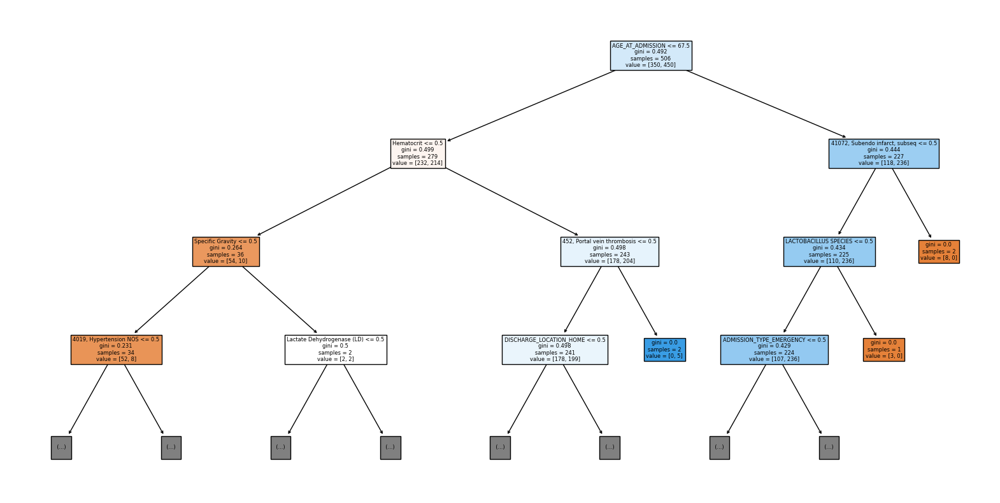

In [ ]:
from sklearn.tree import plot_tree

# Visualizing the first decision tree
plt.figure(figsize=(20,10))
plot_tree(rf.estimators_[0], filled=True, max_depth=3, feature_names=X.columns)
plt.show()

An individual decision tree's visualization highlights the features at the top nodes because they resulted in the largest decrease in impurity for that specific tree. However, this doesn't mean those features consistently had the highest decrease in impurity across all trees in the forest.

Feature Importance:

In Random Forest, feature importance for a variable is typically calculated as the total decrease in node impurity (usually measured by the Gini impurity or entropy) that is brought by that feature, averaged over all trees.

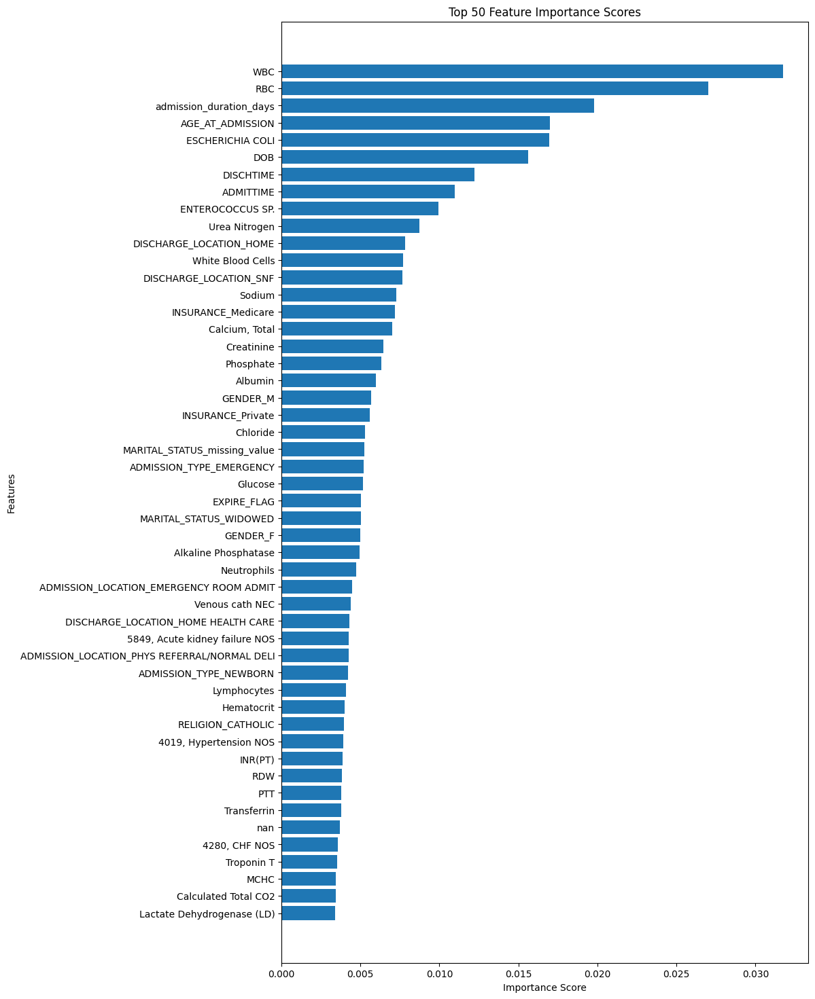

In [ ]:
importances = rf.feature_importances_
features = X.columns

# Get the indices of the top 50 features
sorted_indices = np.argsort(importances)[-50:]

plt.figure(figsize=(10,18))
plt.barh(features[sorted_indices], importances[sorted_indices])
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Top 50 Feature Importance Scores')
plt.show()


According to reviewed literature, systemic inflammatory response in UTI is present only in upper urinary tract infections and in that case abnormal findings of blood test results such as high C-reactive protein, high erythrocytes sedimentation rate, and leukocytosis could be found. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5596611/#:~:text=According%20to%20reviewed%20literature%2C%20systemic,found%20(15%2C%2016).

**Model Evaluation**

classification report

In [ ]:
from sklearn.metrics import classification_report

y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.84      0.66      0.74        88
         1.0       0.77      0.90      0.83       112

    accuracy                           0.80       200
   macro avg       0.81      0.78      0.79       200
weighted avg       0.80      0.80      0.79       200



confusion matrix

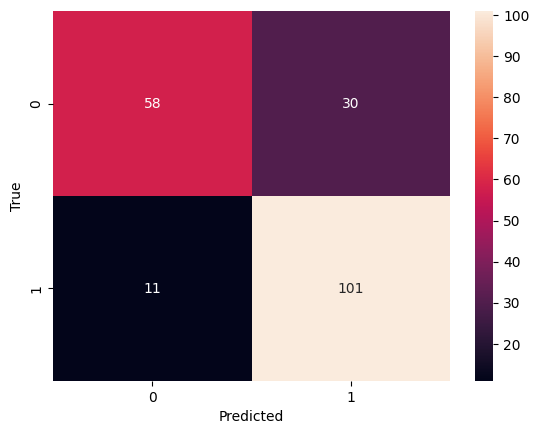

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### Risk Scores

In [ ]:
# Predict probabilities
probabilities = rf.predict_proba(X_test)

# Extract uti risk scores
uti_risk_scores = probabilities[:, 1]
uti_risk_scores_percentage = uti_risk_scores * 100

In [ ]:
# check total number of admissions (test size = 200)
total_admissions_in_histogram = len(uti_risk_scores)
print(f"Total number of admissions in the histogram: {total_admissions_in_histogram}")

Total number of admissions in the histogram: 200


Histogram of risk score

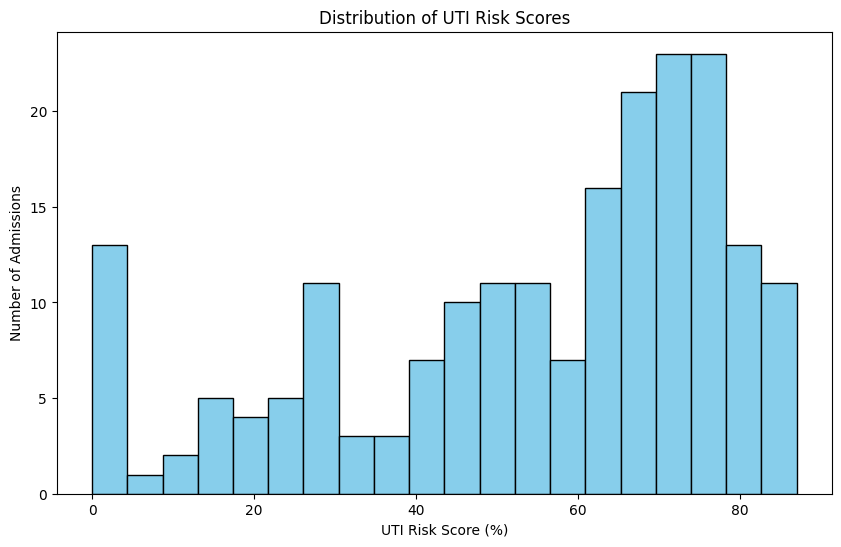

In [ ]:
plt.figure(figsize=(10,6))
plt.hist(uti_risk_scores_percentage, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('UTI Risk Score (%)')
plt.ylabel('Number of Admissions')
plt.title('Distribution of UTI Risk Scores')
plt.show()

Differentiate and see histograms separately for actual UTI and non-UTI patients

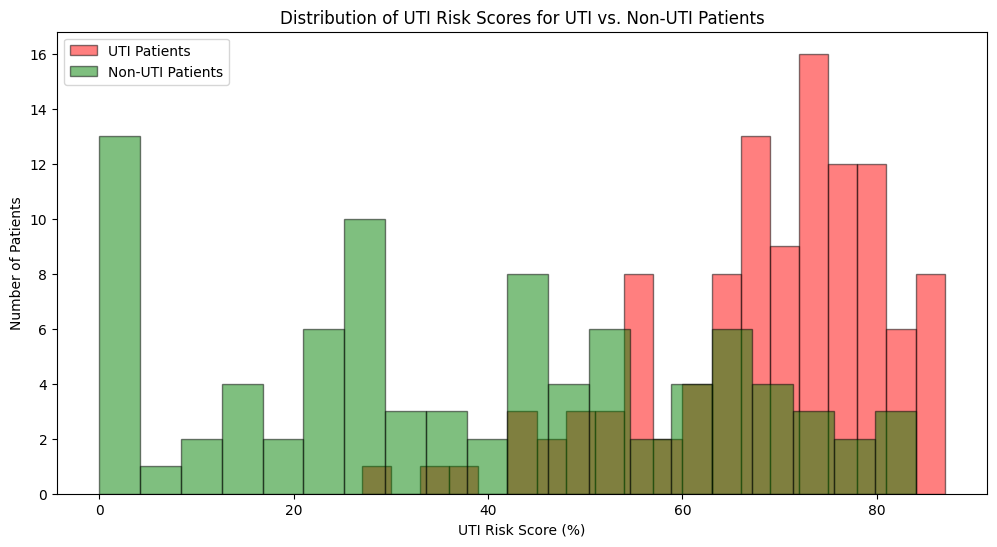

In [ ]:
uti_scores = uti_risk_scores_percentage[y_test == 1]
non_uti_scores = uti_risk_scores_percentage[y_test == 0]

plt.figure(figsize=(12,6))

# Histogram for UTI patients
plt.hist(uti_scores, bins=20, color='red', alpha=0.5, label='UTI Patients', edgecolor='black')

# Histogram for non-UTI patients
plt.hist(non_uti_scores, bins=20, color='green', alpha=0.5, label='Non-UTI Patients', edgecolor='black')

plt.xlabel('UTI Risk Score (%)')
plt.ylabel('Number of Patients')
plt.title('Distribution of UTI Risk Scores for UTI vs. Non-UTI Patients')
plt.legend()
plt.show()


Boxplot of risk score

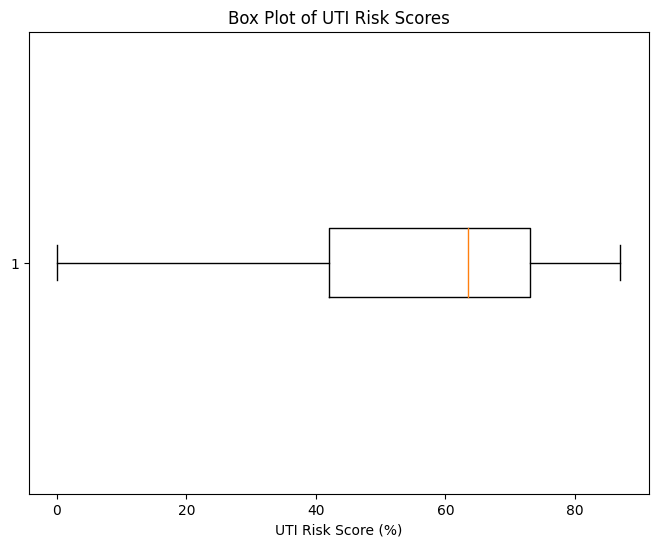

In [ ]:
plt.figure(figsize=(8,6))
plt.boxplot(uti_risk_scores_percentage, vert=False)
plt.xlabel('UTI Risk Score (%)')
plt.title('Box Plot of UTI Risk Scores')
plt.show()

Risk Categories Visualization

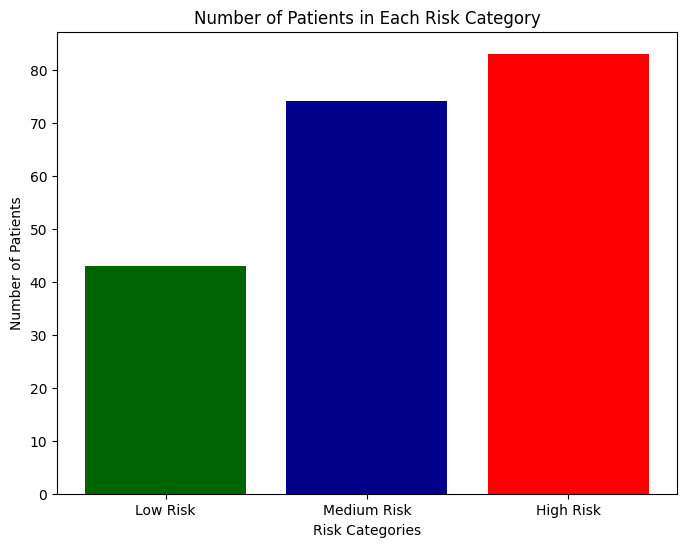

In [ ]:
categories = ['Low Risk', 'Medium Risk', 'High Risk']
counts = [
    sum(uti_risk_scores_percentage <= 33),
    sum((uti_risk_scores_percentage > 33) & (uti_risk_scores_percentage <= 66)),
    sum(uti_risk_scores_percentage > 66)
]

plt.figure(figsize=(8,6))
plt.bar(categories, counts, color=['darkgreen', 'darkblue', 'red'])
plt.xlabel('Risk Categories')
plt.ylabel('Number of Patients')
plt.title('Number of Patients in Each Risk Category')
plt.show()


ROC Curve

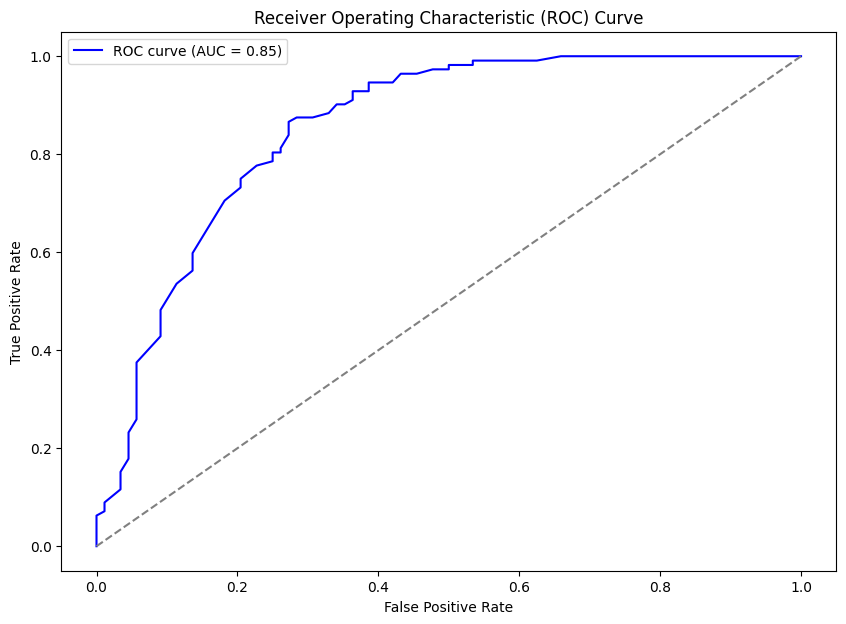

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, uti_risk_scores_percentage/100)

plt.figure(figsize=(10,7))
plt.plot(fpr, tpr, color='blue', label='ROC curve (AUC = {:.2f})'.format(roc_auc_score(y_test, uti_risk_scores_percentage/100)))
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### Codes from Shiv

In [ ]:
# diagnosis_icd[diagnosis_icd['LONG_TITLE'].apply(lambda x:True if 'urinary tract infection' in x.lower() else False)]

In [ ]:
# import pandas as pd
# import numpy as np
# import sweetviz

# admissions= pd.read_csv("data/ADMISSIONS.csv")
# icd = pd.read_csv('data/DIAGNOSES_ICD.csv')
# icd_desc = pd.read_csv('data/D_ICD_DIAGNOSES.csv')
# #Bloods
# bloods = pd.read_csv('data/LABEVENTS.csv')

# #microbiology
# micro = pd.read_csv('data/MICROBIOLOGYEVENTS.csv')

# lab_items = pd.read_csv('data/D_LABITEMS.csv')
# items = lab_items = pd.read_csv('data/D_ITEMS.csv')

# final_df = pd.merge(bloods, lab_items, on ='ITEMID')
# micro_merged = pd.merge(micro, items, left_on='SPEC_ITEMID', right_on='ITEMID')
# icd_merged = pd.merge(icd, icd_desc, on='ICD9_CODE')
# out_df = sweetviz.analyze(admissions[['ETHNICITY','DIAGNOSIS','SUBJECT_ID']])
# uti_icd9 = icd_merged[icd_merged['LONG_TITLE'].apply(lambda x:\
#                                                      'urinary tract' in x.lower())]

# np.random.seed(0)
# hadm_uti = list(set(uti_icd9['HADM_ID'].sample(100)))

Neo4j

In [ ]:
# LOAD CSV WITH HEADERS FROM 'file:///uti.csv' as uti
# MERGE (a:Admission{id:uti.HADM_ID})
# MERGE (icd:ICD{id:uti.SHORT_TITLE})
# MERGE (a)-[:HAS]->(icd)

# MATCH (n:ICD)
# WHERE n.id="Urin tract infection NOS"
# RETURN (n)

# MATCH (a:Admission)-[r:HAS]->(icd:ICD{id:'Urin tract infection NOS'})
# MATCH (a)-[r2:HAS]->(otherICDs)
# WHERE NOT (icd=otherICDs)
# RETURN otherICDs,COUNT(r2) as popularity
# ORDER BY popularity DESC

**30/8 RPH Large Language Model**

Run this in terminal:

ssh -L localhost:5000:localhost:5000 jia@146.118.68.235

In [ ]:
import requests
import re

# For local streaming, the websockets are hosted without ssl - http://
HOST = 'localhost:5000'
URI = f'http://{HOST}/api/v1/generate'

# For reverse-proxied streaming, the remote will likely host with ssl - https://
# URI = 'https://your-uri-here.trycloudflare.com/api/v1/generate'


def run(prompt,disease):
    prompt = prompt.replace('$disease',disease)
    request = {
        'prompt': prompt,
        'max_new_tokens': 250,
        'temperature': 10.0,
        'top_p': 0.1,
        'length_penalty': 5,
        'early_stopping': True,
        'seed': 0,
    }

    response = requests.post(URI, json=request)
    print(response.json()['results'][0]['text'], disease)

    return response.json()['results'][0]['text']


In [ ]:
# if __name__ == '__main__':
#   prompt = '''
#     [INST] <<SYS>>
#     Answer the questions.
# You are a medical expert. Is there a direct relationship between the following and diseases of the lungs?
#     Return Yes or No succinctly.
#     <</SYS>>
#     Input
#     $disease
#     [/INST]
#     '''
# run(prompt,'pneumonia')


# import pandas as pd
# df = pd.read_csv('./data/ADMISSIONS.csv')
# df_new = df.iloc[20:60].apply(lambda x:run(prompt,x['DIAGNOSIS']),axis=1)

Diseases to focus:

- I80 deep vein thrombosis
- N39 / 5990 UTI
- pneumonia